___

<p style="text-align: center;"><img src="https://docs.google.com/uc?id=1lY0Uj5R04yMY3-ZppPWxqCr5pvBLYPnV" class="img-fluid" alt="CLRSWY"></p>

___

# WELCOME!

Welcome to "***Fraud Detection Project***". This is the last project of the Capstone Series.

One of the challenges in this project is the absence of domain knowledge. So without knowing what the column names are, you will only be interested in their values. The other one is the class frequencies of the target variable are quite imbalanced.

You will implement ***Logistic Regression, Random Forest, XGBoost,and Neural Network*** algorithms and ***Unbalanced Data Techniques*** . Also visualize performances of the models using ***Seaborn, Matplotlib*** and ***Yellowbrick*** in a variety of ways.

Data drift and model drirft are key consepts about ML and MLOPS, you can monitor and check your data and models with plenty of ways and tools. ***Deepchecks*** is one of them and the leading tool for testing and for validating your machine learning models and data, and it enables doing so with minimal effort. In this project, you will apply ***Data Integrity, Train-Test Validation, and Model Evaluation*** checks.
Deepchecks Intruduction : https://youtu.be/7ELdizoi6BU

At the end of the project, you will have the opportunity to deploy your model by ***Streamlit API***.

Before diving into the project, please take a look at the Determines and Tasks.

- ***NOTE:*** *This tutorial assumes that you already know the basics of coding in Python and are familiar with model deployement (Streamlit) as well as the theory behind algorithms*



---
---


# #Determines
The datasets contains transactions made by credit cards in September 2013 by european cardholders. This dataset presents transactions that occurred in two days, where it has **492 frauds** out of **284,807** transactions. The dataset is **highly unbalanced**, the positive class (frauds) account for 0.172% of all transactions.

**Feature Information:**

**Time**: This feature is contains the seconds elapsed between each transaction and the first transaction in the dataset. 

**Amount**:  This feature is the transaction Amount, can be used for example-dependant cost-senstive learning. 

**Class**: This feature is the target variable and it takes value 1 in case of fraud and 0 otherwise.

---

The aim of this project is to predict whether a credit card transaction is fraudulent. Of course, this is not easy to do.
First of all, you need to analyze and recognize your data well in order to draw your roadmap and choose the correct arguments you will use. Accordingly, you can examine the frequency distributions of variables. You can observe variable correlations and want to explore multicollinearity. You can display the distribution of the target variable's classes over other variables. 
Also, it is useful to take missing values and outliers.

After these procedures, you can move on to the model building stage by doing the basic data pre-processing you are familiar with. 

Start with Logistic Regression and evaluate model performance. You will apply the Unbalanced Data Techniques used to increase the performance. Next, observe their effects.

Then, you will use four different algorithms in the model building phase. 

In the final step, you will deploy your model using ***Streamlit API***. 

**Optional**: You can Dockerize your project and deploy on cloud.

---
---


# #Tasks

#### 1. Exploratory Data Analysis & Data Cleaning

- Import Modules, Load Data & Data Review
- Apply data integrity checks
- Exploratory Data Analysis
- Data Cleaning
    
#### 2. Data Preprocessing

- Train - Test Split
- Train - Test Split Validation Checks
- Scaling

#### 3. Model Building

- Logistic Regression 
- Random Forest Classifier
- XGBoost Classifier
- Neural Network
- 

#### 4. Model Deployement

- Save and Export the Best Model
- Save and Export Variables




---
---


## Exploratory Data Analysis & Data Cleaning

### Import Modules, Load Data & Data Review

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import patches
import seaborn as sns


# Statistics functions
from scipy.stats import norm
from scipy import stats

import plotly.figure_factory as ff
import cufflinks as cf
#Enabling the offline mode for interactive plotting locally
from plotly.offline import download_plotlyjs,init_notebook_mode,plot,iplot
init_notebook_mode(connected=True)
cf.go_offline()
import plotly.io as pio
pio.renderers.default = "notebook"

# Suppressing a warning
import warnings
warnings.filterwarnings("ignore") 

# To set float format
pd.set_option('display.float_format','{:.2f}'.format)

# Changing the figure size of a seaborn axes 
sns.set(rc={"figure.figsize": (10, 6)})

# The style parameters control properties like the color of the background and whether a grid is enabled by default.
sns.set_style("whitegrid")

# To display maximum columns
pd.set_option('display.max_columns', None)

# To display maximum rows
pd.set_option('display.max_rows', 100)

In [2]:
df_original = pd.read_csv("creditcard.csv")

In [3]:
df = df_original.copy()

In [4]:
df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.00,-1.36,-0.07,2.54,1.38,-0.34,0.46,0.24,0.10,0.36,0.09,-0.55,-0.62,-0.99,-0.31,1.47,-0.47,0.21,0.03,0.40,0.25,-0.02,0.28,-0.11,0.07,0.13,-0.19,0.13,-0.02,149.62,0
1,0.00,1.19,0.27,0.17,0.45,0.06,-0.08,-0.08,0.09,-0.26,-0.17,1.61,1.07,0.49,-0.14,0.64,0.46,-0.11,-0.18,-0.15,-0.07,-0.23,-0.64,0.10,-0.34,0.17,0.13,-0.01,0.01,2.69,0
2,1.00,-1.36,-1.34,1.77,0.38,-0.50,1.80,0.79,0.25,-1.51,0.21,0.62,0.07,0.72,-0.17,2.35,-2.89,1.11,-0.12,-2.26,0.52,0.25,0.77,0.91,-0.69,-0.33,-0.14,-0.06,-0.06,378.66,0
3,1.00,-0.97,-0.19,1.79,-0.86,-0.01,1.25,0.24,0.38,-1.39,-0.05,-0.23,0.18,0.51,-0.29,-0.63,-1.06,-0.68,1.97,-1.23,-0.21,-0.11,0.01,-0.19,-1.18,0.65,-0.22,0.06,0.06,123.50,0
4,2.00,-1.16,0.88,1.55,0.40,-0.41,0.10,0.59,-0.27,0.82,0.75,-0.82,0.54,1.35,-1.12,0.18,-0.45,-0.24,-0.04,0.80,0.41,-0.01,0.80,-0.14,0.14,-0.21,0.50,0.22,0.22,69.99,0


In [5]:
df.sample(5)

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
92655,64033.00,-1.03,-0.30,1.64,-0.86,0.45,-0.99,0.32,-0.35,0.97,0.22,0.89,0.21,-1.58,-0.43,-1.49,-0.15,-0.46,-0.14,0.09,-0.21,-0.13,0.29,-0.27,0.61,-0.83,0.72,-0.13,-0.24,24.10,0
211976,138656.00,1.44,-1.12,-1.18,0.63,-0.41,-0.35,0.21,-0.18,0.41,0.11,0.68,1.26,0.68,0.24,-0.45,0.38,-0.81,0.19,0.18,0.44,0.18,0.01,-0.10,-0.28,-0.28,0.19,-0.10,-0.01,299.95,0
267578,162833.00,-0.17,1.04,0.17,-0.66,0.40,-1.11,1.00,-0.19,0.15,-0.10,-0.96,0.14,0.04,0.03,-0.39,-0.10,-0.44,-0.75,-0.09,0.09,-0.30,-0.60,0.07,-0.03,-0.43,0.15,0.35,0.16,1.98,0
275442,166535.00,1.91,-0.82,-1.04,-0.30,-1.03,-1.82,0.07,-0.59,-0.67,0.69,0.12,0.96,1.48,0.14,0.43,-2.00,0.05,0.78,-1.27,-0.35,0.01,0.47,0.09,0.98,-0.03,0.16,-0.03,-0.03,118.10,0
245634,152838.00,2.06,-0.83,-1.67,-0.63,-0.05,-0.38,-0.11,-0.28,-0.65,0.84,-1.47,0.02,0.98,0.10,0.27,-1.24,-0.44,0.75,-0.41,-0.34,-0.64,-1.51,0.29,0.00,-0.37,0.29,-0.08,-0.04,99.56,0


In [6]:
df.shape

(284807, 31)

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     28

In [8]:
df.isnull().sum()

Time      0
V1        0
V2        0
V3        0
V4        0
V5        0
V6        0
V7        0
V8        0
V9        0
V10       0
V11       0
V12       0
V13       0
V14       0
V15       0
V16       0
V17       0
V18       0
V19       0
V20       0
V21       0
V22       0
V23       0
V24       0
V25       0
V26       0
V27       0
V28       0
Amount    0
Class     0
dtype: int64

In [9]:
# checking duplicates
df.duplicated().sum()

1081

In [10]:
# checking the percentage of duplicates in df
df.duplicated().sum()/df.shape[0]

0.00379555277784605

In [11]:
df.nunique()

Time      124592
V1        275663
V2        275663
V3        275663
V4        275663
V5        275663
V6        275663
V7        275663
V8        275663
V9        275663
V10       275663
V11       275663
V12       275663
V13       275663
V14       275663
V15       275663
V16       275663
V17       275663
V18       275663
V19       275663
V20       275663
V21       275663
V22       275663
V23       275663
V24       275663
V25       275663
V26       275663
V27       275663
V28       275663
Amount     32767
Class          2
dtype: int64

In [12]:
def first_look(col):
    print('column name : ', col)
    print('--------------------------------')
    print('Percent_of_Nulls   : ', '%', round(df[col].isnull().sum() / df.shape[0]*100, 2))
    print('Number_of_Nulls   : ', df[col].isnull().sum())
    print('Number_of_Uniques : ', df[col].nunique())
    print()
    print(f"Value_counts of {col} column:\n", "--"*20,"\n", df[col].value_counts(dropna = False).head(10))
    print()
    if df[col].dtypes == "O" :
        print(f"Value_counts of {col} column with sort_index : \n", "--"*20,"\n", df[col].value_counts(dropna = False).sort_index(key = lambda x : x.str.lower()).head(10))
    else :
        print(f"Value_counts of {col} column with sort_index : \n", "--"*20,"\n", df[col].value_counts(dropna = False).sort_index().head(10))
    print()

In [13]:
for col in df.columns :
    first_look(col)

column name :  Time
--------------------------------
Percent_of_Nulls   :  % 0.0
Number_of_Nulls   :  0
Number_of_Uniques :  124592

Value_counts of Time column:
 ---------------------------------------- 
 163152.00    36
64947.00     26
68780.00     25
3767.00      21
3770.00      20
3750.00      19
19912.00     19
140347.00    19
128860.00    19
143083.00    18
Name: Time, dtype: int64

Value_counts of Time column with sort_index : 
 ---------------------------------------- 
 0.00     2
1.00     2
2.00     2
4.00     1
7.00     2
9.00     1
10.00    3
11.00    1
12.00    3
13.00    1
Name: Time, dtype: int64

column name :  V1
--------------------------------
Percent_of_Nulls   :  % 0.0
Number_of_Nulls   :  0
Number_of_Uniques :  275663

Value_counts of V1 column:
 ---------------------------------------- 
 2.06     77
1.25     77
2.05     62
1.30     60
2.04     53
2.09     48
1.33     45
1.02     40
1.34     39
-0.30    36
Name: V1, dtype: int64

Value_counts of V1 column with sort

Value_counts of V15 column with sort_index : 
 ---------------------------------------- 
 -4.50    1
-4.39    1
-4.20    1
-4.20    1
-4.15    1
-4.10    1
-4.09    1
-4.03    1
-4.01    1
-3.94    1
Name: V15, dtype: int64

column name :  V16
--------------------------------
Percent_of_Nulls   :  % 0.0
Number_of_Nulls   :  0
Number_of_Uniques :  275663

Value_counts of V16 column:
 ---------------------------------------- 
 -0.37    77
0.34     77
0.32     62
-0.12    60
0.18     53
0.23     48
0.88     45
-0.03    40
0.79     39
-0.26    36
Name: V16, dtype: int64

Value_counts of V16 column with sort_index : 
 ---------------------------------------- 
 -14.13    1
-13.56    1
-13.30    1
-13.26    1
-13.25    1
-12.68    1
-12.66    2
-12.45    1
-12.43    1
-12.43    1
Name: V16, dtype: int64

column name :  V17
--------------------------------
Percent_of_Nulls   :  % 0.0
Number_of_Nulls   :  0
Number_of_Uniques :  275663

Value_counts of V17 column:
 ------------------------------

In [14]:
df.groupby("Class").mean()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount
Class,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,94838.20,0.01,-0.01,0.01,-0.01,0.01,0.00,0.01,-0.00,0.00,0.01,-0.01,0.01,0.00,0.01,0.00,0.01,0.01,0.00,-0.00,-0.00,-0.00,-0.00,0.00,0.00,-0.00,-0.00,-0.00,-0.00,88.29
1,80746.81,-4.77,3.62,-7.03,4.54,-3.15,-1.40,-5.57,0.57,-2.58,-5.68,3.80,-6.26,-0.11,-6.97,-0.09,-4.14,-6.67,-2.25,0.68,0.37,0.71,0.01,-0.04,-0.11,0.04,0.05,0.17,0.08,122.21


In [15]:
df.describe().style.background_gradient()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000,284807.000000
mean,94813.859575,0.000000,0.000000,-0.000000,0.000000,-0.000000,0.000000,-0.000000,-0.000000,-0.000000,0.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000,-0.000000,88.349619,0.001727
std,47488.145955,1.958696,1.651309,1.516255,1.415869,1.380247,1.332271,1.237094,1.194353,1.098632,1.088850,1.020713,0.999201,0.995274,0.958596,0.915316,0.876253,0.849337,0.838176,0.814041,0.770925,0.734524,0.725702,0.624460,0.605647,0.521278,0.482227,0.403632,0.330083,250.120109,0.041527
min,0.000000,-56.407510,-72.715728,-48.325589,-5.683171,-113.743307,-26.160506,-43.557242,-73.216718,-13.434066,-24.588262,-4.797473,-18.683715,-5.791881,-19.214325,-4.498945,-14.129855,-25.162799,-9.498746,-7.213527,-54.497720,-34.830382,-10.933144,-44.807735,-2.836627,-10.295397,-2.604551,-22.565679,-15.430084,0.000000,0.000000
25%,54201.500000,-0.920373,-0.598550,-0.890365,-0.848640,-0.691597,-0.768296,-0.554076,-0.208630,-0.643098,-0.535426,-0.762494,-0.405571,-0.648539,-0.425574,-0.582884,-0.468037,-0.483748,-0.498850,-0.456299,-0.211721,-0.228395,-0.542350,-0.161846,-0.354586,-0.317145,-0.326984,-0.070840,-0.052960,5.600000,0.000000
50%,84692.000000,0.018109,0.065486,0.179846,-0.019847,-0.054336,-0.274187,0.040103,0.022358,-0.051429,-0.092917,-0.032757,0.140033,-0.013568,0.050601,0.048072,0.066413,-0.065676,-0.003636,0.003735,-0.062481,-0.029450,0.006782,-0.011193,0.040976,0.016594,-0.052139,0.001342,0.011244,22.000000,0.000000
75%,139320.500000,1.315642,0.803724,1.027196,0.743341,0.611926,0.398565,0.570436,0.327346,0.597139,0.453923,0.739593,0.618238,0.662505,0.493150,0.648821,0.523296,0.399675,0.500807,0.458949,0.133041,0.186377,0.528554,0.147642,0.439527,0.350716,0.240952,0.091045,0.078280,77.165000,0.000000
max,172792.000000,2.454930,22.057729,9.382558,16.875344,34.801666,73.301626,120.589494,20.007208,15.594995,23.745136,12.018913,7.848392,7.126883,10.526766,8.877742,17.315112,9.253526,5.041069,5.591971,39.420904,27.202839,10.503090,22.528412,4.584549,7.519589,3.517346,31.612198,33.847808,25691.160000,1.000000


In [16]:
df.corr()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
Time,1.00,0.12,-0.01,-0.42,-0.11,0.17,-0.06,0.08,-0.04,-0.01,0.03,-0.25,0.12,-0.07,-0.10,-0.18,0.01,-0.07,0.09,0.03,-0.05,0.04,0.14,0.05,-0.02,-0.23,-0.04,-0.01,-0.01,-0.01,-0.01
V1,0.12,1.00,0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,-0.00,0.00,0.00,0.00,-0.00,-0.00,0.00,0.00,-0.00,0.00,0.00,0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,0.00,0.00,-0.23,-0.10
V2,-0.01,0.00,1.00,0.00,-0.00,0.00,0.00,0.00,-0.00,0.00,-0.00,0.00,-0.00,0.00,-0.00,-0.00,0.00,-0.00,0.00,-0.00,0.00,-0.00,0.00,0.00,0.00,-0.00,0.00,-0.00,-0.00,-0.53,0.09
V3,-0.42,-0.00,0.00,1.00,0.00,-0.00,0.00,0.00,-0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,-0.00,0.00,-0.00,-0.00,0.00,-0.00,-0.00,0.00,0.00,-0.21,-0.19
V4,-0.11,-0.00,-0.00,0.00,1.00,-0.00,-0.00,-0.00,0.00,0.00,0.00,0.00,-0.00,0.00,0.00,0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,0.00,0.00,0.00,-0.00,0.00,-0.00,0.10,0.13
V5,0.17,0.00,0.00,-0.00,-0.00,1.00,0.00,0.00,0.00,0.00,-0.00,0.00,0.00,0.00,0.00,-0.00,0.00,0.00,0.00,-0.00,-0.00,-0.00,0.00,-0.00,-0.00,0.00,0.00,0.00,-0.00,-0.39,-0.09
V6,-0.06,-0.00,0.00,0.00,-0.00,0.00,1.00,0.00,-0.00,0.00,0.00,0.00,0.00,-0.00,0.00,-0.00,0.00,0.00,0.00,-0.00,-0.00,0.00,-0.00,0.00,-0.00,0.00,-0.00,-0.00,0.00,0.22,-0.04
V7,0.08,-0.00,0.00,0.00,-0.00,0.00,0.00,1.00,0.00,0.00,-0.00,0.00,-0.00,0.00,0.00,-0.00,0.00,0.00,0.00,-0.00,0.00,-0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,-0.00,0.40,-0.19
V8,-0.04,-0.00,-0.00,-0.00,0.00,0.00,-0.00,0.00,1.00,0.00,-0.00,0.00,0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,-0.00,0.00,0.00,0.00,0.00,-0.00,-0.00,-0.00,0.00,-0.00,-0.10,0.02
V9,-0.01,-0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00,-0.00,0.00,-0.00,0.00,0.00,-0.00,-0.00,0.00,0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,0.00,-0.00,-0.00,0.00,-0.04,-0.10


In [17]:
df.corr()["Class"].sort_values()

V17      -0.33
V14      -0.30
V12      -0.26
V10      -0.22
V16      -0.20
V3       -0.19
V7       -0.19
V18      -0.11
V1       -0.10
V9       -0.10
V5       -0.09
V6       -0.04
Time     -0.01
V24      -0.01
V13      -0.00
V15      -0.00
V23      -0.00
V22       0.00
V25       0.00
V26       0.00
Amount    0.01
V28       0.01
V27       0.02
V8        0.02
V20       0.02
V19       0.03
V21       0.04
V2        0.09
V4        0.13
V11       0.15
Class     1.00
Name: Class, dtype: float64

### Apply Data Integrity Checks
* link: https://docs.deepchecks.com/stable/user-guide/tabular/auto_quickstarts/plot_quick_data_integrity.html

In [18]:
# import sys
# !{sys.executable} -m pip install deepchecks -U --quiet

In [19]:
#pip install deepchecks --upgrade

In [6]:
from deepchecks.tabular.suites import data_integrity
from deepchecks.tabular import Dataset

In [7]:
ds = Dataset(df, cat_features=[], datetime_name='Time', label= 'Class')

In [8]:
# Run Suite:
integ_suite = data_integrity()
suite_result = integ_suite.run(ds)
# Note: the result can be saved as html using suite_result.save_as_html()
# or exported to json using suite_result.to_json()
suite_result.show()

deepchecks - WARNING - Due to the small number of unique labels task type was inferred as classification in spite of the label column is of type integer. Initialize your Dataset with either label_type="multiclass" or label_type="regression" to resolve this warning.


Accordion(children=(VBox(children=(HTML(value='\n            <h1 id="summary_V1IHP2CM32OEWMVRSLXQ4HFMQ">Data I…

### Exploratory Data Analysis

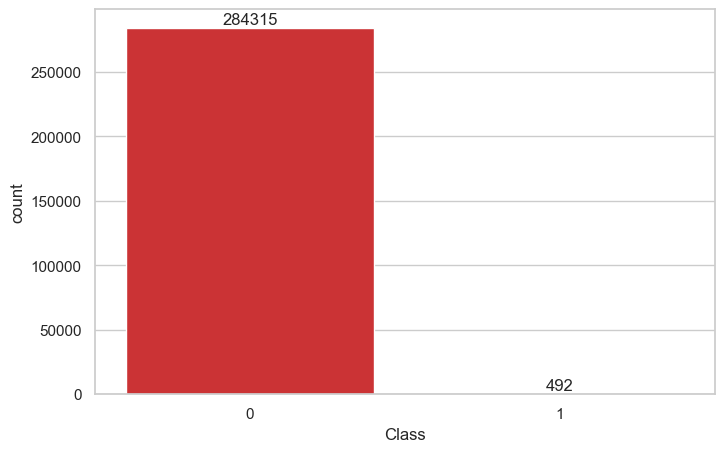

In [23]:
plt.figure(figsize=(8,5))
ax = sns.countplot(x="Class", data=df, palette="Set1")
plt.xlabel("Class")
ax.bar_label(ax.containers[0]);

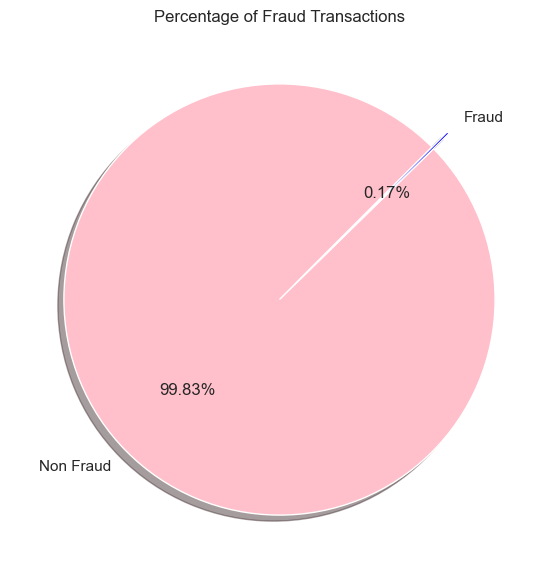

In [24]:
fig = plt.figure(figsize =(10, 7))
plt.pie(df.Class.value_counts(normalize=True), 
        labels = ["Non Fraud","Fraud"], explode = (0, 0.1),autopct='%1.2f%%',shadow=True, startangle=45,
        colors=['pink', 'blue'])
plt.title("Percentage of Fraud Transactions")
plt.show()

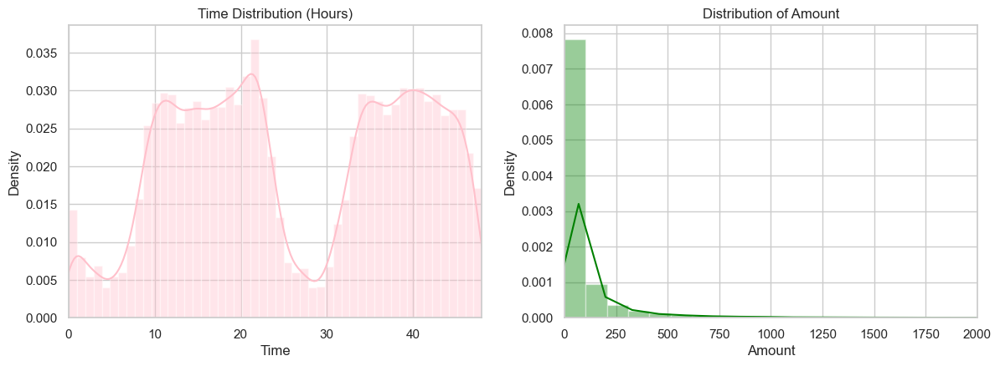

In [25]:
# plot the Time distribution
plt.figure(figsize=(14,10))

plt.subplot(2, 2, 1)
plt.title('Time Distribution (Hours)')
sns.distplot(df['Time']/3600, color='pink')
plt.xlim(0,48);

#plot the Amount disribution
plt.subplot(2, 2, 2)
plt.title('Distribution of Amount')
sns.distplot(df['Amount'], color='green', bins=250)
plt.xlim(0,2000);

<AxesSubplot:>

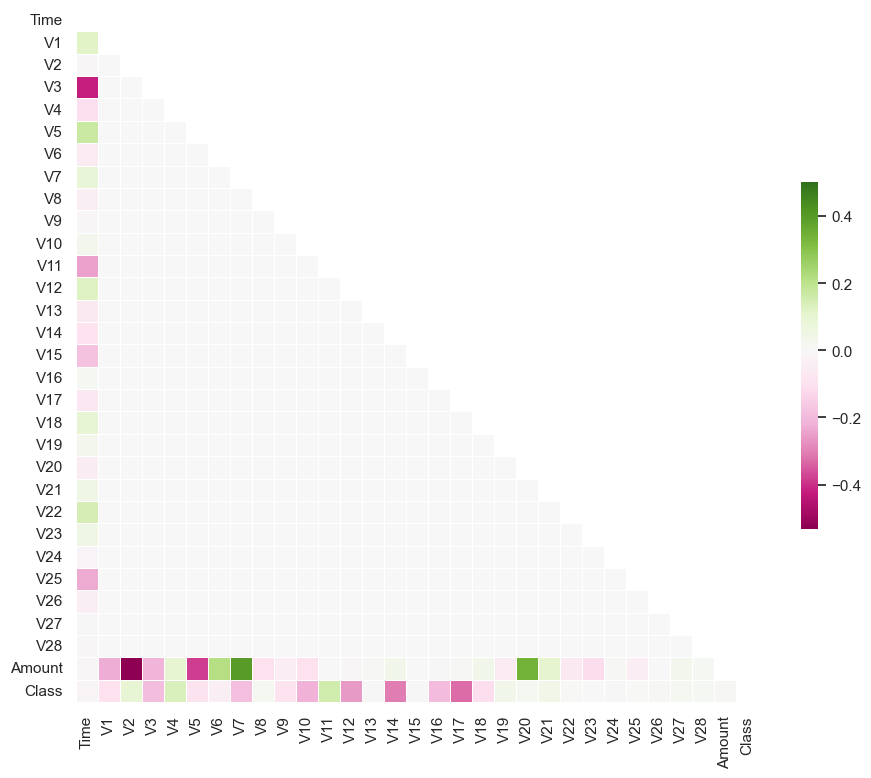

In [26]:
# Draw the heatmap
mask = np.zeros_like(df.corr(), dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

fig, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(df.corr(), mask=mask, cmap='PiYG', vmax=.5, center=0, linewidths=.5, cbar_kws={"shrink": .5})

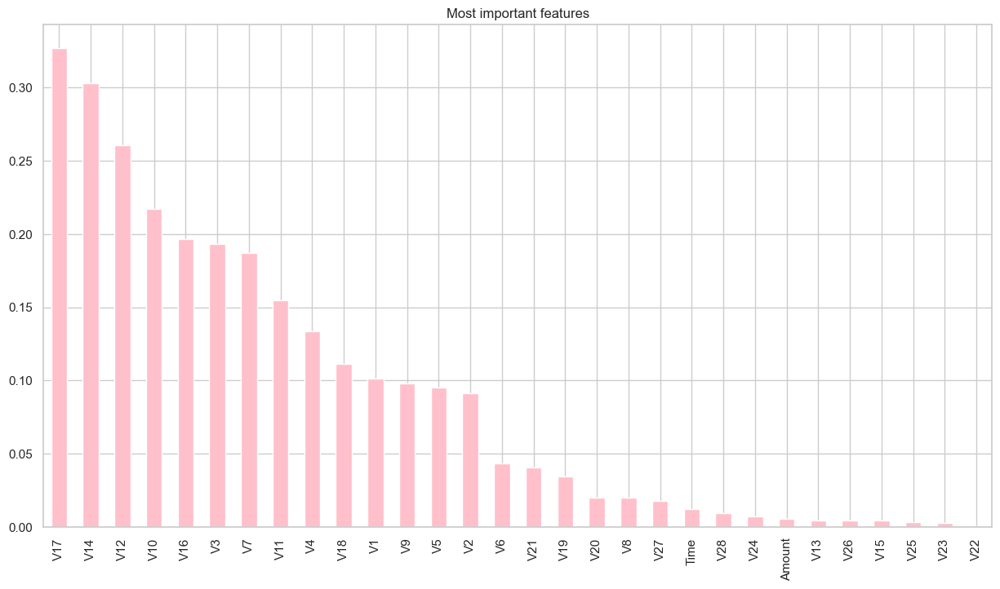

In [27]:
#Absolute values of corroleations
plt.figure(figsize=(15,8))
df.corr()['Class'][:-1].abs().sort_values(ascending=False).plot(kind='bar', title='Most important features', color = "pink")
plt.show()

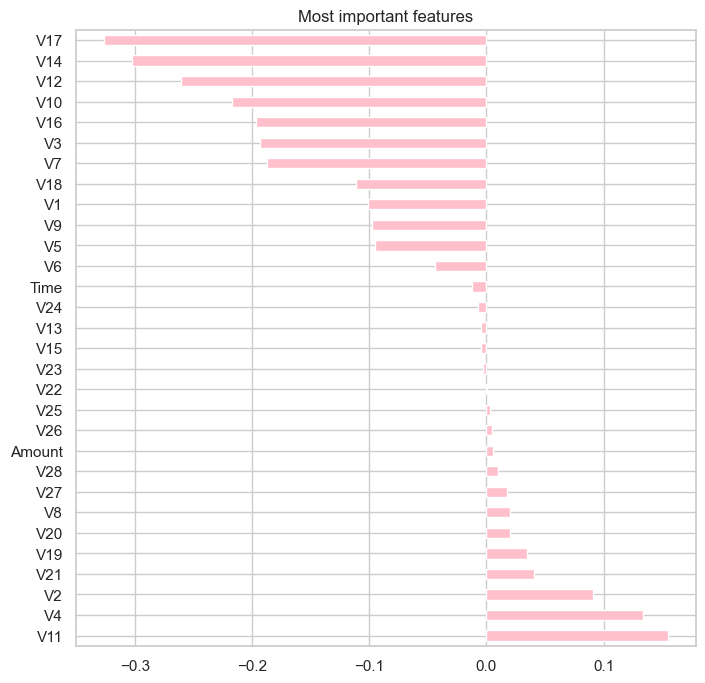

In [28]:
plt.figure(figsize=(8,8))
df.corr()['Class'][:-1].sort_values(ascending=False).plot(kind='barh', title='Most important features', color = "pink")
plt.show()

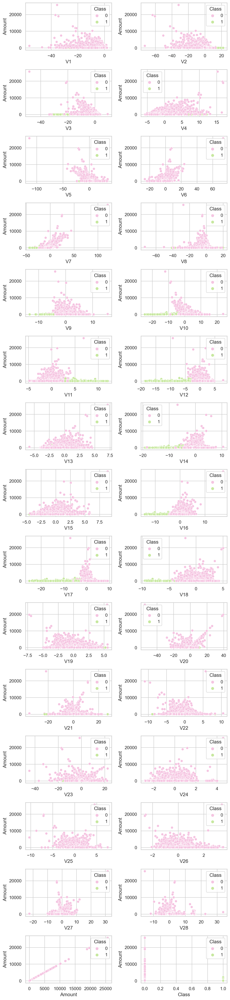

In [29]:
fig = plt.figure(figsize=(8,36), dpi=200)
for i, col in enumerate(df.iloc[:, 1:]):
        plt.subplot(16,2,i+1)
        sns.scatterplot(x= col, y="Amount", hue="Class", data=df, palette="PiYG", )
plt.tight_layout();

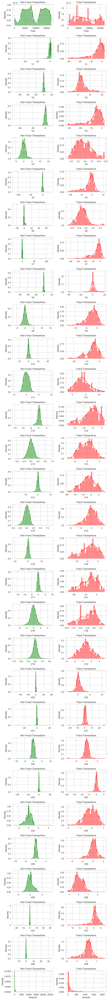

In [30]:
fig, ax = plt.subplots(ncols=2, nrows= 30, figsize=(8,72), dpi=200)
for i, col in enumerate(df.iloc[:, :-1]):
    s = sns.histplot(ax = ax[i][0], x=col, data=df.iloc[:, :-1].loc[df["Class"] == 0], kde=True, color="green", bins=30, stat="density")
    ax[i][0].title.set_text("Non Fraud Transactions")
    s = sns.histplot(ax = ax[i][1], x=col, data=df.iloc[:, :-1].loc[df["Class"] == 1], kde=True, color="red", bins=30, stat="density")
    ax[i][1].title.set_text("Fraud Transactions")
plt.tight_layout()
plt.show();

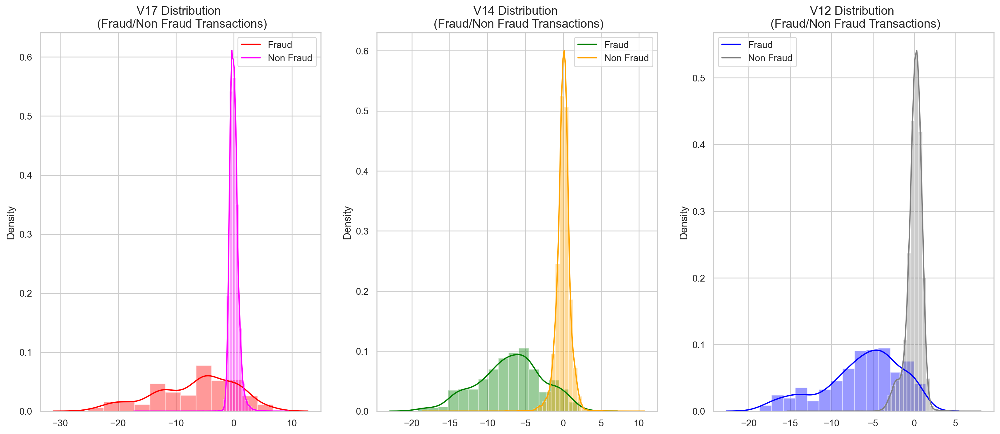

In [31]:
#Most correlated features with the Class label
fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(20,8), dpi=200)

v17_fraud = df['V17'].loc[df['Class'] == 1].values
sns.distplot(v17_fraud,ax=ax1, color='red')
v17_non_fraud = df['V17'].loc[df['Class'] == 0].values
sns.distplot(v17_non_fraud, ax=ax1, color='magenta')
ax1.set_title('V17 Distribution \n (Fraud/Non Fraud Transactions)', fontsize=14)
ax1.legend(labels=["Fraud", "Non Fraud"])

v14_fraud = df['V14'].loc[df['Class'] == 1].values
sns.distplot(v14_fraud, ax=ax2, color='green')
v17_non_fraud = df['V14'].loc[df['Class'] == 0].values
sns.distplot(v17_non_fraud, ax=ax2, color='orange')
ax2.set_title('V14 Distribution \n (Fraud/Non Fraud Transactions)', fontsize=14)
ax2.legend(labels=["Fraud", "Non Fraud"])

v12_fraud = df['V12'].loc[df['Class'] == 1].values
sns.distplot(v12_fraud,ax=ax3, color='blue')
v17_non_fraud = df['V12'].loc[df['Class'] == 0].values
sns.distplot(v17_non_fraud, ax=ax3, color='gray')
ax3.set_title('V12 Distribution \n (Fraud/Non Fraud Transactions)', fontsize=14)
ax3.legend(labels=["Fraud", "Non Fraud"])

plt.show()

In [32]:
#plot the Time density 
non_fraud = (df.loc[df['Class'] == 0]["Time"])/3600
fraud = (df.loc[df['Class'] == 1]["Time"])/3600
hist_data = [non_fraud, fraud]

fig = ff.create_distplot(hist_data, group_labels = ['Non Fraud', 'Fraud'], show_hist=False, colors=["green", "red"], show_rug=False)
fig['layout'].update(title='Credit Card Transactions Time Density Plot', xaxis=dict(title='Time in hours'))
iplot(fig, filename='dist_only')

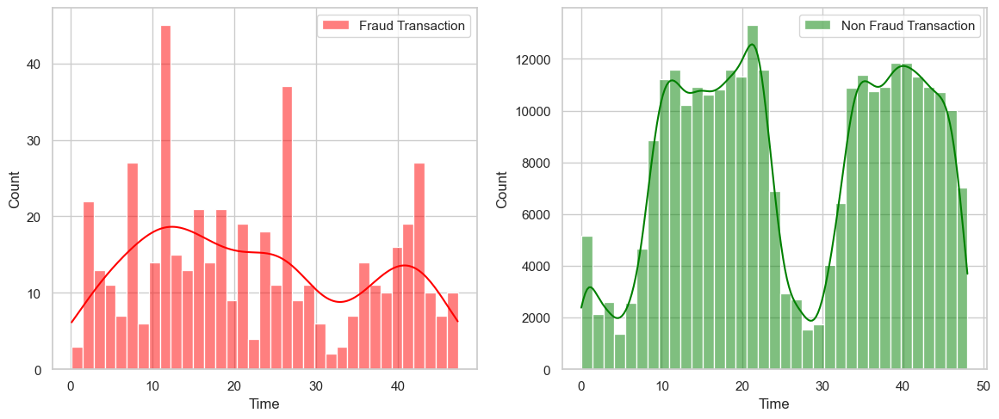

In [33]:
#hisplot of Time feature according to the labels
plt.figure(figsize=(14, 12))

plt.subplot(2, 2, 1)
sns.histplot(data=(df[df.Class == 1].Time)/3600, bins=35, color='red', label="Fraud Transaction", kde=True)
plt.legend()

plt.subplot(2, 2, 2)
sns.histplot(data=(df[df.Class == 0].Time)/3600, bins=35, color='green', label="Non Fraud Transaction", kde=True)
plt.legend()

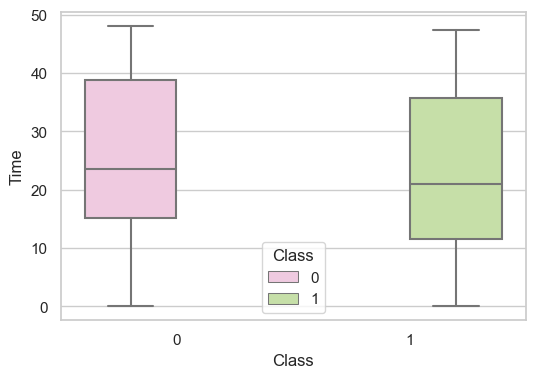

In [34]:
#boxplot of Time feature
fig, ax = plt.subplots(figsize=(6,4))
sns.boxplot(ax = ax, x="Class", y=df["Time"]/3600, hue="Class", data=df, palette="PiYG", showfliers=True)
plt.show();

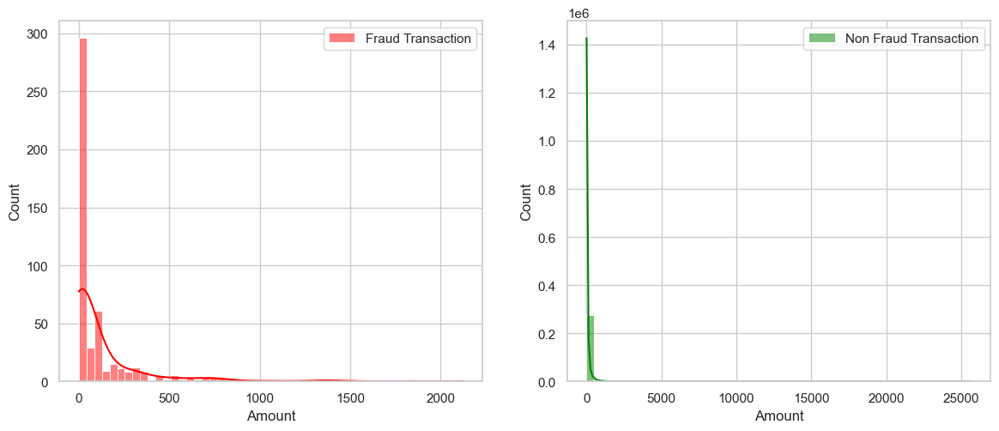

In [35]:
#hisplot of Amount feature according to the labels
plt.figure(figsize=(14, 12))

plt.subplot(2, 2, 1)
sns.histplot(data= df[df.Class == 1].Amount, bins=50, color='red', label="Fraud Transaction", kde=True)
plt.legend()

plt.subplot(2, 2, 2)
sns.histplot(data=df[df.Class == 0].Amount, bins=50, color='green', label="Non Fraud Transaction", kde=True)
plt.legend()

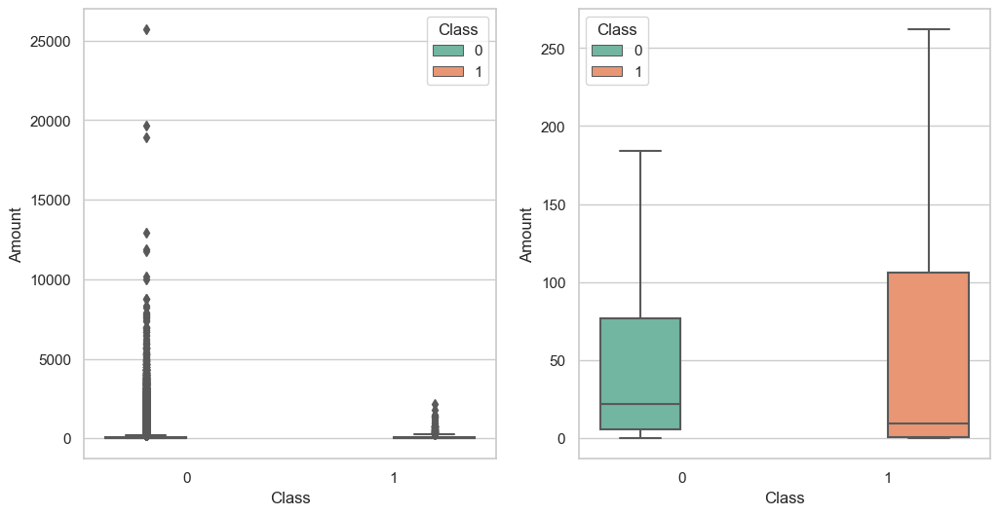

In [36]:
#boxplot of Amount feature
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(12,6))
sns.boxplot(ax = ax1, x="Class", y="Amount", hue="Class",data=df, palette="Set2",showfliers=True)
sns.boxplot(ax = ax2, x="Class", y="Amount", hue="Class",data=df, palette="Set2",showfliers=False)
plt.show();

### Data Cleaning
Check Missing Values and Outliers

In [37]:
df.isnull().sum().sum()

0

- From the result in above, we can find that there is no missing data in this dataset.

#### Drop Duplicates

In [9]:
from deepchecks.tabular.checks import DataDuplicates

DataDuplicates().run(ds)

deepchecks - WARNING - Due to the small number of unique labels task type was inferred as classification in spite of the label column is of type integer. Initialize your Dataset with either label_type="multiclass" or label_type="regression" to resolve this warning.


In [10]:
df[df.duplicated()]["Class"].value_counts()

0    1062
1      19
Name: Class, dtype: int64

In [11]:
#drop duplicates
df.drop_duplicates(inplace=True, ignore_index=True)
ds = Dataset(df, cat_features=[], datetime_name='Time', label='Class')
result = DataDuplicates().add_condition_ratio_less_or_equal(0).run(ds)
result.show()

deepchecks - WARNING - Due to the small number of unique labels task type was inferred as classification in spite of the label column is of type integer. Initialize your Dataset with either label_type="multiclass" or label_type="regression" to resolve this warning.


In [41]:
df.shape

(283726, 31)

#### Handling with Outliers

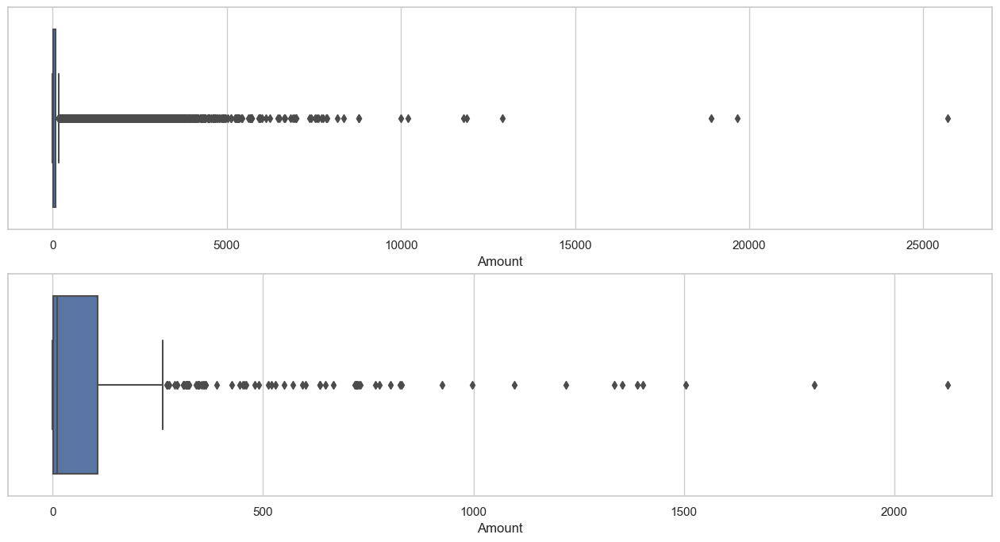

In [45]:
#boxplot of Amount features
fig, ax = plt.subplots(2, 1, figsize=(16,8))
sns.boxplot(x=df[df['Class'] == 0].Amount, ax=ax[0]) 
sns.boxplot(x=df[df['Class'] == 1].Amount, ax=ax[1])
plt.show()

- As it is seen above, most of the outliers according to Amount is in the Class 0, while the max value in the Class 1 is about 2500. Thus, we decide to drop the Amount values higher than or equal to 2500.

In [46]:
df['Class'].value_counts()

0    283253
1       473
Name: Class, dtype: int64

In [12]:
df = df[df.Amount<=(df[df['Class'] == 1].Amount.max())]

print(df['Class'].value_counts())
print('\nPercentage of fraud transaction: {:.3%}'.format((df[df['Class'] == 1].shape[0] / df.shape[0])))

0    282650
1       473
Name: Class, dtype: int64

Percentage of fraud transaction: 0.167%


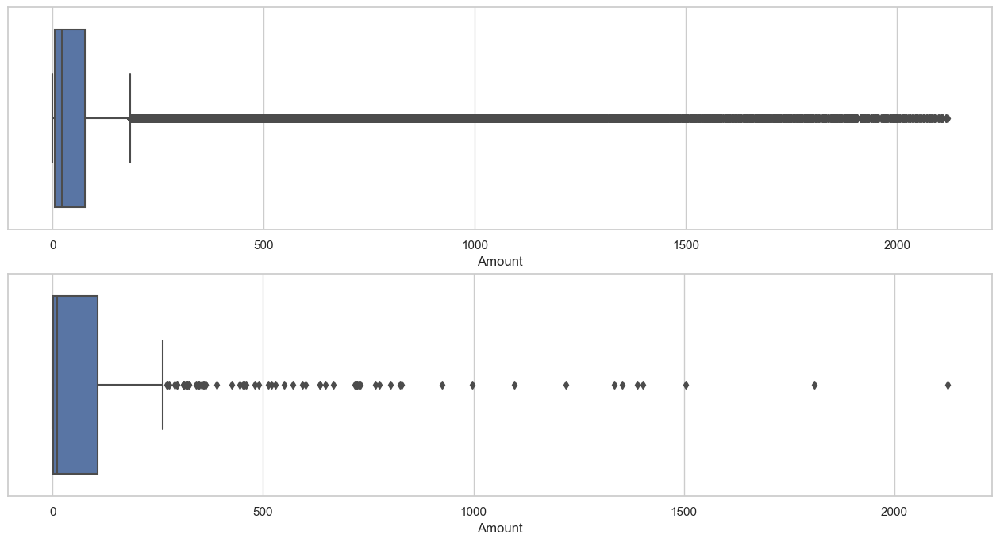

In [49]:
#boxplot of Amount after dropping
fig, ax = plt.subplots(2, 1, figsize=(16,8))
sns.boxplot(x=df[df['Class'] == 0].Amount, ax=ax[0]) 
sns.boxplot(x=df[df['Class'] == 1].Amount, ax=ax[1])
plt.show()

- Looking at the boxplots of Amount features for fraud and non fraud transactions, we can see that most of the outliers have been removed.

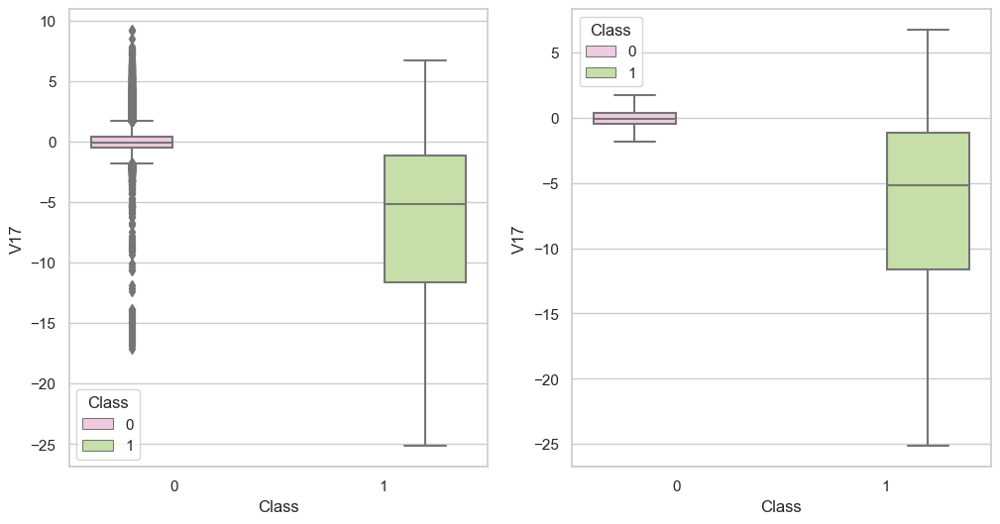

In [50]:
#V17 has the max correlation with our target feature, Class.
# Boxplot of V17 
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(12,6))
sns.boxplot(ax = ax1, x="Class", y="V17", hue="Class", data=df, palette="PiYG", showfliers=True)
sns.boxplot(ax = ax2, x="Class", y="V17", hue="Class", data=df, palette="PiYG", showfliers=False)
plt.show();

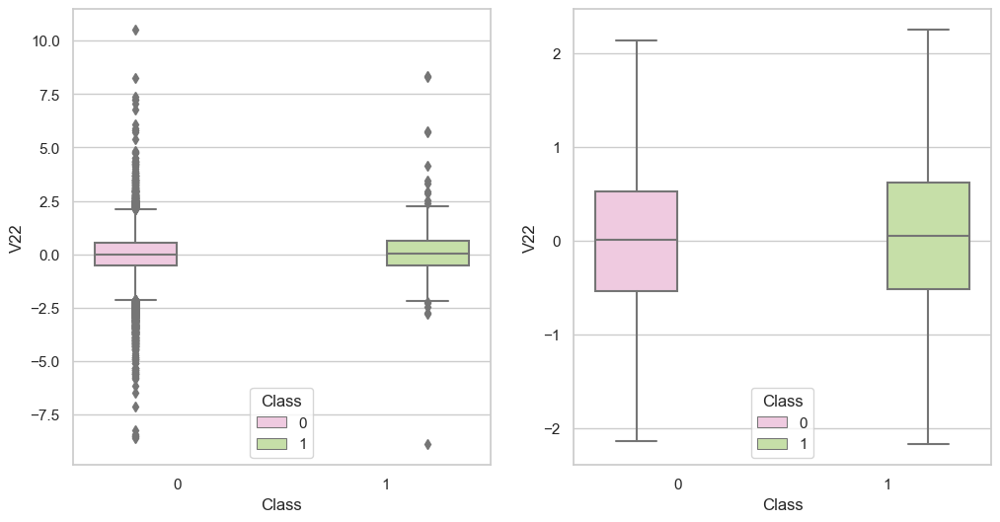

In [51]:
#V22 has the minimum correlation with our target feature, Class.
# Boxplot of V22 
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(12,6))
sns.boxplot(ax = ax1, x="Class", y="V22", hue="Class", data=df, palette="PiYG", showfliers=True)
sns.boxplot(ax = ax2, x="Class", y="V22", hue="Class", data=df, palette="PiYG", showfliers=False)
plt.show();

In [52]:
df.shape

(283123, 31)

---
---


## Data Preprocessing

In [13]:
#drop Time column
df = df.drop(columns="Time").reset_index()

### Train - Test Split

As in this case, for extremely imbalanced datasets you may want to make sure that classes are balanced across train and test data.

In [14]:
from sklearn.model_selection import train_test_split
X = df.drop("Class", axis=1)
y = df["Class"]
random_state = 101

X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state=random_state)

### Train-Test Validation Checks
* link : https://docs.deepchecks.com/stable/user-guide/tabular/auto_quickstarts/plot_quick_train_test_validation.html

In [15]:
from deepchecks.tabular import Dataset

# We explicitly state that this dataset has no categorical features, otherwise they will be automatically inferred
# If the dataset has categorical features, the best practice is to pass a list with their names

ds_train = Dataset(X_train, label=y_train, cat_features=[])
ds_test =  Dataset(X_test,  label=y_test, cat_features=[])

In [16]:
from deepchecks.tabular.suites import train_test_validation

validation_suite = train_test_validation()
suite_result = validation_suite.run(ds_train, ds_test)
# Note: the result can be saved as html using suite_result.save_as_html() or exported to json using suite_result.to_json()

suite_result

deepchecks - WARNING - Due to the small number of unique labels task type was inferred as classification in spite of the label column is of type integer. Initialize your Dataset with either label_type="multiclass" or label_type="regression" to resolve this warning.


Accordion(children=(VBox(children=(HTML(value='\n            <h1 id="summary_6ZD6S97TTHD6WA983BGGCW8OA">Train …

### Scaling

In [17]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

---
---


## Model Building
It was previously stated that you need to make class prediction with three different algorithms. As in this case, different approaches are required to obtain better performance on unbalanced data.

This dataset is severely **unbalanced** (most of the transactions are non-fraud). So the algorithms are much more likely to classify new observations to the majority class and high accuracy won't tell us anything. To address the problem of imbalanced dataset, we can use undersampling and oversampling or class weight and optimum thresold techniques. 

***Note***: 

- *Do not forget to import the necessary libraries and modules before starting the model building!*

- *If you are going to use the cross validation method to be more sure of the performance of your model for unbalanced data, you should make sure that the class distributions in the iterations are equal. For this case, you should use **[StratifiedKFold](https://www.analyseup.com/python-machine-learning/stratified-kfold.html)** instead of regular cross validation method.*

### Define Useful Functions for Models

In [18]:
# define a function to compare evaluation metrics of models

def eval_metric(model, X_train, y_train, X_test, y_test):
    y_train_pred = model.predict(X_train)
    y_pred = model.predict(X_test)
    
    print("Test_Set")
    print(confusion_matrix(y_test, y_pred))
    print(classification_report(y_test, y_pred))
    print()
    print("Train_Set")
    print(confusion_matrix(y_train, y_train_pred))
    print(classification_report(y_train, y_train_pred))

In [19]:
from sklearn.metrics import classification_report, accuracy_score, recall_score, precision_score, f1_score, log_loss
from sklearn.metrics import ConfusionMatrixDisplay, plot_confusion_matrix, confusion_matrix

def eval_metric_classification(model, X_train, y_train, X_test, y_test, model_name='', ml_model=True, average=None, labels=None):
    """ average (None, 'micro', 'macro', 'samples', 'weighted', 'binary')"""
    # The style parameters control properties like the color of the background and whether a grid is enabled by default.
    sns.set_style("whitegrid", {'axes.grid' : False})
    if ml_model:
      y_pred_test = model.predict(X_test)
      y_pred_train = model.predict(X_train)
    else:
      y_pred_test = model.predict(X_test) >= 0.5
      y_pred_train = model.predict(X_train) >= 0.5
    
    print("TEST REPORT")
    print(classification_report(y_test, y_pred_test))
    fig, ax = plt.subplots(2, 1, figsize=(7, 7))
    ConfusionMatrixDisplay.from_predictions(y_test, y_pred_test, ax=ax[0]);
    print("\n"*1, "-*"*30)
    print("TRAIN REPORT")
    print(classification_report(y_train, y_pred_train))
    ConfusionMatrixDisplay.from_predictions(y_train, y_pred_train, ax=ax[1]);
    plt.tight_layout()
    
    return pd.DataFrame.from_dict({
        'accuracy_test' :accuracy_score(y_test, y_pred_test),
        'f1_test'       :np.array(f1_score(y_test, y_pred_test, average=average, labels=labels)).ravel()[0],
        'recall_test'   :np.array(recall_score(y_test, y_pred_test, average=average, labels=labels)).ravel()[0],
        'precision_test':np.array(precision_score(y_test, y_pred_test, average=average, labels=labels)).ravel()[0],        
        'accuracy_train' :accuracy_score(y_train, y_pred_train),
        'f1_train'       :np.array(f1_score(y_train, y_pred_train, average=average, labels=labels)).ravel()[0],        
        'recall_train'   :np.array(recall_score(y_train, y_pred_train, average=average, labels=labels)).ravel()[0],
        'precision_train':np.array(precision_score(y_train, y_pred_train, average=average, labels=labels)).ravel()[0],
    }, orient='index', columns=[model_name]).T

### Logistic Regression 

- The steps you are going to cover for this algorithm are as follows: 

   *i. Import Libraries*
   
   *ii. Model Training*
   
   *iii. Prediction and Model Evaluating (Apply StratifiedKFold) and Tuning*
   
   *iv. Plot Precision and Recall Curve*

***i. Import Libraries***

In [20]:
# sklearn library for machine learning algorithms, data preprocessing, and evaluation
from sklearn.model_selection import train_test_split, GridSearchCV, cross_validate
from sklearn.linear_model import LogisticRegression

from sklearn.metrics import classification_report, confusion_matrix, log_loss, recall_score, accuracy_score, precision_score, f1_score, plot_confusion_matrix, roc_auc_score
from sklearn.metrics import make_scorer, average_precision_score

# yellowbrick library for visualizing the model performance
from yellowbrick.classifier import ConfusionMatrix

from sklearn.pipeline import Pipeline

***ii. Model Training***

In [21]:
log_model = LogisticRegression(random_state=random_state)
log_model.fit(X_train_scaled,y_train)

LogisticRegression(random_state=101)

In [22]:
eval_metric(log_model, X_train_scaled, y_train, X_test_scaled, y_test)

Test_Set
[[56510     9]
 [   44    62]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56519
           1       0.87      0.58      0.70       106

    accuracy                           1.00     56625
   macro avg       0.94      0.79      0.85     56625
weighted avg       1.00      1.00      1.00     56625


Train_Set
[[226089     42]
 [   152    215]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    226131
           1       0.84      0.59      0.69       367

    accuracy                           1.00    226498
   macro avg       0.92      0.79      0.84    226498
weighted avg       1.00      1.00      1.00    226498



***iii. Model Evaluating (Apply StratifiedKFold) and Tuning***

In [23]:
from sklearn.model_selection import StratifiedKFold 
from sklearn.model_selection import cross_val_score

skf = StratifiedKFold(n_splits=5, random_state=random_state, shuffle=True)

model = LogisticRegression(random_state=random_state)

scores = cross_validate(model, X_train_scaled, y_train, scoring = ["accuracy", "f1", "recall", "precision"], cv = skf, return_train_score=True)
df_scores =  pd.DataFrame.from_dict(scores, orient='columns')
display(df_scores)
df_scores.mean()[2:]

,fit_time,score_time,test_accuracy,train_accuracy,test_f1,train_f1,test_recall,train_recall,test_precision,train_precision
0,0.80,0.03,1.00,1.00,0.59,0.69,0.45,0.59,0.85,0.84
1,0.84,0.03,1.00,1.00,0.70,0.70,0.59,0.60,0.85,0.83
2,0.63,0.02,1.00,1.00,0.70,0.70,0.59,0.60,0.85,0.85
3,0.61,0.02,1.00,1.00,0.70,0.70,0.60,0.59,0.83,0.84
4,0.56,0.02,1.00,1.00,0.70,0.69,0.62,0.58,0.80,0.84


test_accuracy     1.00
train_accuracy    1.00
test_f1           0.68
train_f1          0.69
test_recall       0.57
train_recall      0.59
test_precision    0.83
train_precision   0.84
dtype: float64

***iv. Logistic Regression with GridSearchCV***

In [24]:
from sklearn.model_selection import GridSearchCV

log_model = LogisticRegression(random_state=random_state)

skf = StratifiedKFold(n_splits=5, random_state=random_state, shuffle=True)

param_grid = {"penalty" :["l1", "l2"],
              "C" : [np.logspace(-1, 5, 20),1],
              "solver":["lbfgs", "liblinear", "saga"]
             } 

# to get the best model
grid_log_model = GridSearchCV(estimator=log_model,
                          param_grid=param_grid,
                          cv=skf,
                          scoring = 'recall',       
                          n_jobs = -1)
grid_log_model.fit(X_train_scaled,y_train)
grid_log_model.best_params_

{'C': 1, 'penalty': 'l1', 'solver': 'liblinear'}

In [25]:
eval_metric(grid_log_model, X_train_scaled, y_train, X_test_scaled, y_test) 

Test_Set
[[56510     9]
 [   44    62]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56519
           1       0.87      0.58      0.70       106

    accuracy                           1.00     56625
   macro avg       0.94      0.79      0.85     56625
weighted avg       1.00      1.00      1.00     56625


Train_Set
[[226089     42]
 [   151    216]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    226131
           1       0.84      0.59      0.69       367

    accuracy                           1.00    226498
   macro avg       0.92      0.79      0.85    226498
weighted avg       1.00      1.00      1.00    226498




You're evaluating "accuracy score"? Is your performance metric reflect real success? You may need to use different metrics to evaluate performance on unbalanced data. You should use **[precision and recall metrics](https://scikit-learn.org/stable/auto_examples/model_selection/plot_precision_recall.html#:~:text=The%20precision%2Drecall%20curve%20shows,a%20low%20false%20negative%20rate.)**.

***iv. Plot Precision and Recall Curve***


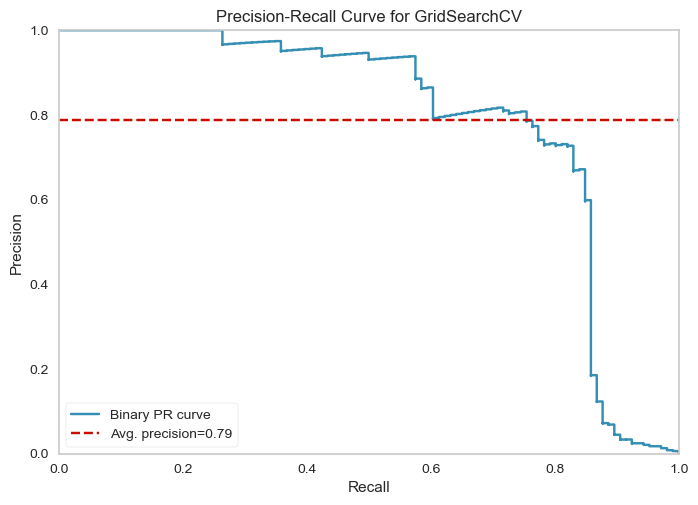

In [26]:
from yellowbrick.classifier import PrecisionRecallCurve

viz = PrecisionRecallCurve(
    grid_log_model,
    per_class=True,
    cmap="Set1"
)
viz.fit(X_train_scaled, y_train)
viz.score(X_test_scaled, y_test)
viz.show();

- Didn't the performance of the model you implemented above satisfy you? If your model is biased towards the majority class and minority class matrics is not sufficient, apply "unbalanced data tecniques".

***v. Prediction***

TEST REPORT
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56519
           1       0.87      0.58      0.70       106

    accuracy                           1.00     56625
   macro avg       0.94      0.79      0.85     56625
weighted avg       1.00      1.00      1.00     56625


 -*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
TRAIN REPORT
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    226131
           1       0.84      0.59      0.69       367

    accuracy                           1.00    226498
   macro avg       0.92      0.79      0.85    226498
weighted avg       1.00      1.00      1.00    226498



,accuracy_test,f1_test,recall_test,precision_test,accuracy_train,f1_train,recall_train,precision_train
Logistic Regression,1.00,0.70,0.58,0.87,1.00,0.69,0.59,0.84


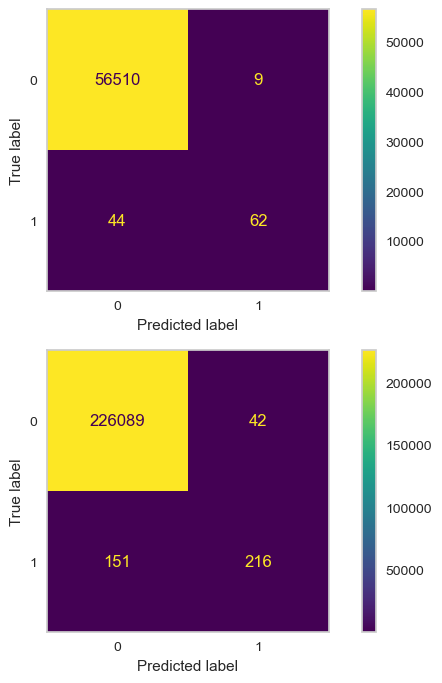

In [27]:
out_score_log = eval_metric_classification(
    grid_log_model, X_train_scaled, y_train, X_test_scaled, y_test, 
    'Logistic Regression', average=None, labels=[1]
)
out_score_log

***vi. Apply Model Evaluation Checks***
* link : https://docs.deepchecks.com/stable/user-guide/tabular/auto_quickstarts/plot_quick_model_evaluation.html

In [28]:
train_ds = Dataset(pd.DataFrame(X_train_scaled, index=y_train.index, columns=X_train.columns), label=y_train, cat_features=[])
test_ds = Dataset(pd.DataFrame(X_test_scaled, index=y_test.index, columns=X_test.columns), label=y_test, cat_features=[])

In [29]:
from deepchecks.tabular.suites import model_evaluation

evaluation_suite = model_evaluation()
suite_result = evaluation_suite.run(train_ds, test_ds, grid_log_model)
# Note: the result can be saved as html using suite_result.save_as_html()
# or exported to json using suite_result.to_json()
suite_result.show()

deepchecks - WARNING - Could not find built-in feature importance on the model, using permutation feature importance calculation instead
deepchecks - INFO - Calculating permutation feature importance. Expected to finish in 11 seconds


Accordion(children=(VBox(children=(HTML(value='\n            <h1 id="summary_ZVWRC2DNV7TEGCJPCBUJT6BOT">Model …

### Logistic Regression with Unbalanced Data Techniques

- The steps you are going to cover for this algorithm are as follows: 

   *i. Import Libraries*
   
   *ii. Model Training*
   
   *iii. Prediction and Model Evaluating (Apply StratifiedKFold) and Tuning*
   
   *iv. Plot Precision and Recall Curve*

***i. Train-Test Split (Again)***

In [30]:
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state=random_state)
scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

#### Applying Logistic Regression with Class Weight

In [31]:
log_model_cw = LogisticRegression(random_state=random_state, class_weight="balanced")
log_model_cw.fit(X_train_scaled,y_train)

LogisticRegression(class_weight='balanced', random_state=101)

In [32]:
eval_metric(log_model_cw, X_train_scaled, y_train, X_test_scaled, y_test)

Test_Set
[[55296  1223]
 [   10    96]]
              precision    recall  f1-score   support

           0       1.00      0.98      0.99     56519
           1       0.07      0.91      0.13       106

    accuracy                           0.98     56625
   macro avg       0.54      0.94      0.56     56625
weighted avg       1.00      0.98      0.99     56625


Train_Set
[[221206   4925]
 [    29    338]]
              precision    recall  f1-score   support

           0       1.00      0.98      0.99    226131
           1       0.06      0.92      0.12       367

    accuracy                           0.98    226498
   macro avg       0.53      0.95      0.55    226498
weighted avg       1.00      0.98      0.99    226498



In [33]:
# with customized class_weight
class_weights_custom = {0: 1, 1: 8}
log_model_cwc = LogisticRegression(random_state=random_state, class_weight=class_weights_custom)
log_model_cwc.fit(X_train_scaled,y_train)

LogisticRegression(class_weight={0: 1, 1: 8}, random_state=101)

In [34]:
eval_metric(log_model_cwc, X_train_scaled, y_train, X_test_scaled, y_test)

Test_Set
[[56500    19]
 [   18    88]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56519
           1       0.82      0.83      0.83       106

    accuracy                           1.00     56625
   macro avg       0.91      0.91      0.91     56625
weighted avg       1.00      1.00      1.00     56625


Train_Set
[[226043     88]
 [    75    292]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    226131
           1       0.77      0.80      0.78       367

    accuracy                           1.00    226498
   macro avg       0.88      0.90      0.89    226498
weighted avg       1.00      1.00      1.00    226498



***iii. Prediction and Model Evaluating (Apply StratifiedKFold) and Tuning***

In [35]:
from sklearn.model_selection import cross_validate 

skf = StratifiedKFold(n_splits=5, random_state=random_state, shuffle=True)

class_weights_custom = {0: 1, 1: 8}
model = LogisticRegression(random_state=random_state, class_weight=class_weights_custom)

scores = cross_validate(model, X_train_scaled, y_train,scoring = ["accuracy", "f1", "recall", "precision"], cv = skf, return_train_score=True)
df_scores =  pd.DataFrame.from_dict(scores, orient='columns')
display(df_scores)
df_scores.mean()[2:]

,fit_time,score_time,test_accuracy,train_accuracy,test_f1,train_f1,test_recall,train_recall,test_precision,train_precision
0,0.66,0.03,1.00,1.00,0.76,0.78,0.77,0.80,0.76,0.76
1,0.70,0.02,1.00,1.00,0.77,0.78,0.77,0.80,0.76,0.77
2,0.56,0.02,1.00,1.00,0.77,0.78,0.77,0.80,0.76,0.76
3,0.52,0.02,1.00,1.00,0.75,0.78,0.81,0.80,0.69,0.77
4,0.53,0.03,1.00,1.00,0.79,0.77,0.84,0.78,0.75,0.77


test_accuracy     1.00
train_accuracy    1.00
test_f1           0.77
train_f1          0.78
test_recall       0.79
train_recall      0.80
test_precision    0.74
train_precision   0.76
dtype: float64

***iv. Logistic Regression with GridSearchCV***

In [36]:
from sklearn.model_selection import GridSearchCV

class_weights_custom = {0: 1, 1: 8}
model = LogisticRegression(random_state=random_state, class_weight=class_weights_custom)

skf = StratifiedKFold(n_splits=5, random_state=random_state, shuffle=True)

param_grid = {"penalty" :["l1", "l2"],
              "C" : [np.logspace(-1, 5, 20),1],
              "solver":["lbfgs", "liblinear", "sag"]
             } 

# to get the best model
grid_log_cwc_model = GridSearchCV(estimator=model,
                          param_grid=param_grid,
                          cv=skf,
                          scoring = 'recall',       
                          n_jobs = -1)
grid_log_cwc_model.fit(X_train_scaled,y_train)
grid_log_cwc_model.best_params_

{'C': 1, 'penalty': 'l1', 'solver': 'liblinear'}

In [37]:
eval_metric(grid_log_cwc_model, X_train_scaled, y_train, X_test_scaled, y_test)

Test_Set
[[56500    19]
 [   18    88]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56519
           1       0.82      0.83      0.83       106

    accuracy                           1.00     56625
   macro avg       0.91      0.91      0.91     56625
weighted avg       1.00      1.00      1.00     56625


Train_Set
[[226044     87]
 [    75    292]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    226131
           1       0.77      0.80      0.78       367

    accuracy                           1.00    226498
   macro avg       0.89      0.90      0.89    226498
weighted avg       1.00      1.00      1.00    226498



***v.  Plot Precision and Recall Curve***


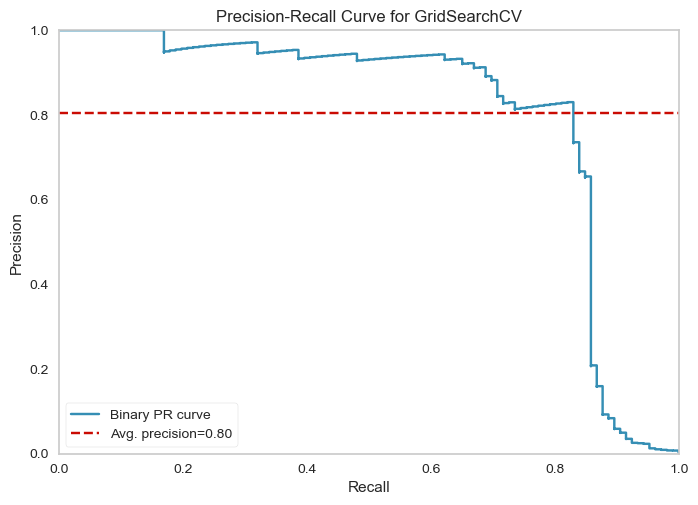

In [38]:
from yellowbrick.classifier import PrecisionRecallCurve

viz = PrecisionRecallCurve(
    grid_log_cwc_model,
    per_class=True,
    cmap="Set1"
)
viz.fit(X_train_scaled, y_train)
viz.score(X_test_scaled, y_test)
viz.show();

***vi. Prediction***

TEST REPORT
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56519
           1       0.82      0.83      0.83       106

    accuracy                           1.00     56625
   macro avg       0.91      0.91      0.91     56625
weighted avg       1.00      1.00      1.00     56625


 -*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
TRAIN REPORT
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    226131
           1       0.77      0.80      0.78       367

    accuracy                           1.00    226498
   macro avg       0.89      0.90      0.89    226498
weighted avg       1.00      1.00      1.00    226498



,accuracy_test,f1_test,recall_test,precision_test,accuracy_train,f1_train,recall_train,precision_train
Logistic Regression with CW,1.00,0.83,0.83,0.82,1.00,0.78,0.80,0.77


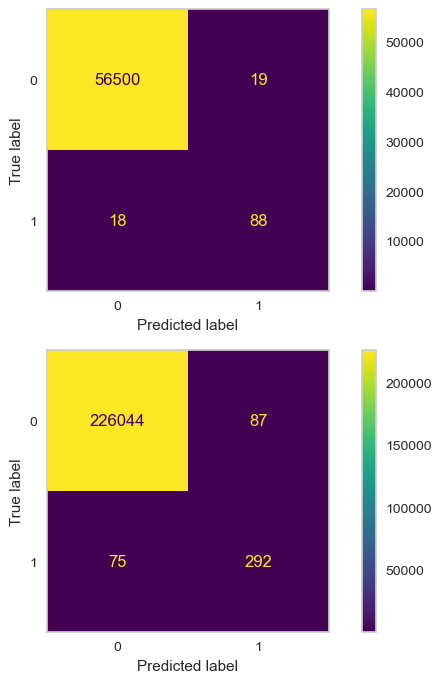

In [39]:
out_score_log_cwc = eval_metric_classification(
    grid_log_cwc_model, X_train_scaled, y_train, X_test_scaled, y_test, 
    'Logistic Regression with CW', average=None, labels=[1]
)
out_score_log_cwc

***vii. Apply Model Evaluation Checks***
* link : https://docs.deepchecks.com/stable/user-guide/tabular/auto_quickstarts/plot_quick_model_evaluation.html

In [40]:
train_ds = Dataset(pd.DataFrame(X_train_scaled, index=y_train.index, columns=X_train.columns), label=y_train, cat_features=[])
test_ds = Dataset(pd.DataFrame(X_test_scaled, index=y_test.index, columns=X_test.columns), label=y_test, cat_features=[])

In [41]:
evaluation_suite = model_evaluation()
suite_result = evaluation_suite.run(train_ds, test_ds, grid_log_cwc_model)
# Note: the result can be saved as html using suite_result.save_as_html()
# or exported to json using suite_result.to_json()
suite_result.show()

deepchecks - WARNING - Could not find built-in feature importance on the model, using permutation feature importance calculation instead
deepchecks - INFO - Calculating permutation feature importance. Expected to finish in 12 seconds


Accordion(children=(VBox(children=(HTML(value='\n            <h1 id="summary_RP7BZTYRIXS6EVZQZUEZZV7YT">Model …

#### Applying Logistic Regression with SMOTE

In [42]:
# pip install imblearn

In [43]:
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline as imbpipeline

In [44]:
over = SMOTE(sampling_strategy={1: 500})
under = RandomUnderSampler(sampling_strategy={0: 100000})

# We are configuring our pipeline steps
steps = [("over",over),("under",under)]
pipeline = imbpipeline(steps = steps)
X_resampled, y_resampled = pipeline.fit_resample(X_train,y_train)

In [45]:
smote_log= RandomForestClassifier(random_state= random_state)
smote_log.fit(X_resampled, y_resampled)

<IPython.core.display.Javascript object>

RandomForestClassifier(random_state=101)

In [46]:
eval_metric(smote_log, X_resampled, y_resampled, X_test_scaled, y_test)

Test_Set
[[56511     8]
 [   20    86]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56519
           1       0.91      0.81      0.86       106

    accuracy                           1.00     56625
   macro avg       0.96      0.91      0.93     56625
weighted avg       1.00      1.00      1.00     56625


Train_Set
[[100000      0]
 [     1    499]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    100000
           1       1.00      1.00      1.00       500

    accuracy                           1.00    100500
   macro avg       1.00      1.00      1.00    100500
weighted avg       1.00      1.00      1.00    100500



***i. SMOTE Logistic Regression with GridSearchCV***

In [47]:
from sklearn.model_selection import GridSearchCV

class_weights_custom = {0: 1, 1: 2}
model = LogisticRegression(random_state=random_state, class_weight=class_weights_custom)

skf = StratifiedKFold(n_splits=5, random_state=random_state, shuffle=True)
model = LogisticRegression(random_state=random_state, class_weight=class_weights_custom)


param_grid = {"penalty" :["l1", "l2"],
              "C" : [np.logspace(-1, 5, 20),1],
              "solver":["lbfgs", "liblinear", "sag"]
             } 

# to get the best model
grid_log_smote_model = GridSearchCV(estimator=model,
                          param_grid=param_grid,
                          cv=skf,
                          scoring = 'recall',       
                          n_jobs = -1)
grid_log_smote_model.fit(X_train_scaled,y_train)
grid_log_smote_model.best_params_

{'C': 1, 'penalty': 'l2', 'solver': 'sag'}

In [48]:
eval_metric(grid_log_smote_model, X_train_scaled, y_train, X_test_scaled, y_test)

Test_Set
[[56501    18]
 [   31    75]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56519
           1       0.81      0.71      0.75       106

    accuracy                           1.00     56625
   macro avg       0.90      0.85      0.88     56625
weighted avg       1.00      1.00      1.00     56625


Train_Set
[[226068     63]
 [   115    252]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    226131
           1       0.80      0.69      0.74       367

    accuracy                           1.00    226498
   macro avg       0.90      0.84      0.87    226498
weighted avg       1.00      1.00      1.00    226498



***ii. Plot Precision and Recall Curve***

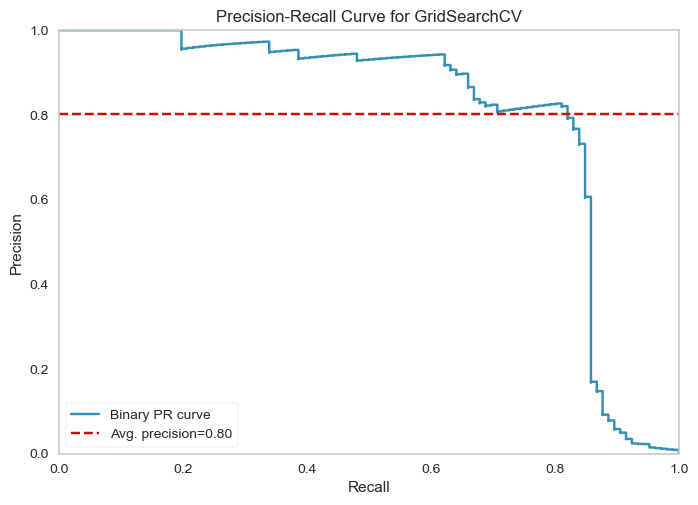

In [49]:
from yellowbrick.classifier import PrecisionRecallCurve

viz = PrecisionRecallCurve(
    estimator=grid_log_smote_model,
    classes=grid_log_smote_model.classes_, 
    per_class=True,
    cmap="Set1"
)
viz.fit(X_train_scaled, y_train)
viz.score(X_test_scaled, y_test)
viz.show();

***iii. Prediction***

TEST REPORT
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56519
           1       0.81      0.71      0.75       106

    accuracy                           1.00     56625
   macro avg       0.90      0.85      0.88     56625
weighted avg       1.00      1.00      1.00     56625


 -*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
TRAIN REPORT
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    226131
           1       0.80      0.69      0.74       367

    accuracy                           1.00    226498
   macro avg       0.90      0.84      0.87    226498
weighted avg       1.00      1.00      1.00    226498



,accuracy_test,f1_test,recall_test,precision_test,accuracy_train,f1_train,recall_train,precision_train
Logistic Regression with SMOTE,1.00,0.75,0.71,0.81,1.00,0.74,0.69,0.80


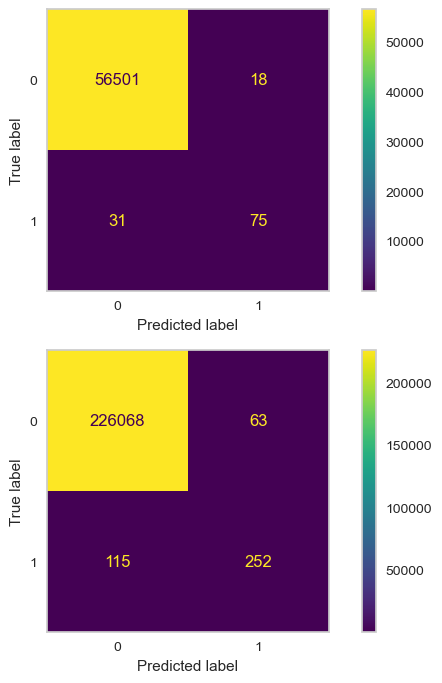

In [50]:
out_score_log_smote = eval_metric_classification(
    grid_log_smote_model, X_train_scaled, y_train, X_test_scaled, y_test, 
    'Logistic Regression with SMOTE', average=None, labels=[1]
)
out_score_log_smote

***iv. Apply Model Evaluation Checks***
* link : https://docs.deepchecks.com/stable/user-guide/tabular/auto_quickstarts/plot_quick_model_evaluation.html

In [51]:
train_ds = Dataset(pd.DataFrame(X_train_scaled, index=y_train.index, columns=X_train.columns), label=y_train, cat_features=[])
test_ds = Dataset(pd.DataFrame(X_test_scaled, index=y_test.index, columns=X_test.columns), label=y_test, cat_features=[])

In [52]:
evaluation_suite = model_evaluation()
suite_result = evaluation_suite.run(train_ds, test_ds, grid_log_smote_model)
# Note: the result can be saved as html using suite_result.save_as_html()
# or exported to json using suite_result.to_json()
suite_result.show()

deepchecks - WARNING - Could not find built-in feature importance on the model, using permutation feature importance calculation instead
deepchecks - INFO - Calculating permutation feature importance. Expected to finish in 9 seconds


Accordion(children=(VBox(children=(HTML(value='\n            <h1 id="summary_2LBQD8LUT1J54XVU47F6WNRP4">Model …

### Random Forest Classifier with Unbalanced Data Techniques

- The steps you are going to cover for this algorithm are as follows:

   *i. Model Training*
   
   *ii. Prediction and Model Evaluating (Apply StratifiedKFold) and Tuning*
   
   *iii. Plot Precision and Recall Curve*
   

In [53]:
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state=random_state)

#### Apply RandomForest with Class Weight

***i. Model Training***

In [54]:
# with class_weight = "balanced"
from sklearn.ensemble import RandomForestClassifier

rf_model_cw = RandomForestClassifier(n_estimators=10, class_weight="balanced", random_state=random_state)
rf_model_cw.fit(X_train,y_train)

RandomForestClassifier(class_weight='balanced', n_estimators=10,
                       random_state=101)

In [55]:
eval_metric(rf_model_cw, X_train, y_train, X_test, y_test)

Test_Set
[[56517     2]
 [   29    77]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56519
           1       0.97      0.73      0.83       106

    accuracy                           1.00     56625
   macro avg       0.99      0.86      0.92     56625
weighted avg       1.00      1.00      1.00     56625


Train_Set
[[226131      0]
 [    18    349]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    226131
           1       1.00      0.95      0.97       367

    accuracy                           1.00    226498
   macro avg       1.00      0.98      0.99    226498
weighted avg       1.00      1.00      1.00    226498



In [56]:
# with customized class_weight
class_weights_custom = {0: 1, 1: 8}
rf_model_cwc = RandomForestClassifier(random_state=random_state, class_weight=class_weights_custom)
rf_model_cwc.fit(X_train,y_train)

RandomForestClassifier(class_weight={0: 1, 1: 8}, random_state=101)

In [57]:
eval_metric(rf_model_cwc, X_train, y_train, X_test, y_test)

Test_Set
[[56516     3]
 [   21    85]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56519
           1       0.97      0.80      0.88       106

    accuracy                           1.00     56625
   macro avg       0.98      0.90      0.94     56625
weighted avg       1.00      1.00      1.00     56625


Train_Set
[[226131      0]
 [     1    366]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    226131
           1       1.00      1.00      1.00       367

    accuracy                           1.00    226498
   macro avg       1.00      1.00      1.00    226498
weighted avg       1.00      1.00      1.00    226498



***ii. Prediction and Model Evaluating (Apply StratifiedKFold) and Tuning***

In [58]:
from sklearn.model_selection import cross_validate 

skf = StratifiedKFold(n_splits=5, random_state=random_state, shuffle=True)

class_weights_custom = {0: 1, 1: 8}
model = RandomForestClassifier(random_state=random_state, class_weight=class_weights_custom)

scores = cross_validate(model, X_train, y_train,scoring = ["accuracy", "f1", "recall", "precision"], cv = skf)
df_scores =  pd.DataFrame.from_dict(scores, orient='columns')
display(df_scores)
df_scores.mean()[2:]

,fit_time,score_time,test_accuracy,test_f1,test_recall,test_precision
0,88.51,0.30,1.00,0.85,0.77,0.95
1,88.17,0.31,1.00,0.85,0.76,0.97
2,86.84,0.31,1.00,0.83,0.73,0.96
3,86.19,0.31,1.00,0.80,0.73,0.90
4,83.39,0.31,1.00,0.85,0.75,0.96


test_accuracy    1.00
test_f1          0.84
test_recall      0.75
test_precision   0.95
dtype: float64

In [59]:
# reset the model
class_weights_custom = {0: 1, 1: 8}
model = RandomForestClassifier(random_state=random_state, class_weight=class_weights_custom)

#Apply StratifiedKFold splitting strategy as cross validate object in GridSearch
skf = StratifiedKFold(n_splits=5, random_state=random_state, shuffle=True)

# define grid parameters
param_grid = {
            "n_estimators":[20,50],
            "criterion":["entropy","gini"],
            "max_features":['auto',"log2"],
            "max_depth": [2,3,5]
           }

# built RF grid model
grid_rfcwc_model = GridSearchCV(estimator=model,
                          param_grid=param_grid,
                          scoring="recall",
                          cv=skf,
                          n_jobs = -1)

In [60]:
grid_rfcwc_model.fit(X_train, y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=101, shuffle=True),
             estimator=RandomForestClassifier(class_weight={0: 1, 1: 8},
                                              random_state=101),
             n_jobs=-1,
             param_grid={'criterion': ['entropy', 'gini'],
                         'max_depth': [2, 3, 5],
                         'max_features': ['auto', 'log2'],
                         'n_estimators': [20, 50]},
             scoring='recall')

In [61]:
eval_metric(grid_rfcwc_model, X_train, y_train, X_test, y_test) 

Test_Set
[[56513     6]
 [   17    89]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56519
           1       0.94      0.84      0.89       106

    accuracy                           1.00     56625
   macro avg       0.97      0.92      0.94     56625
weighted avg       1.00      1.00      1.00     56625


Train_Set
[[226083     48]
 [    65    302]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    226131
           1       0.86      0.82      0.84       367

    accuracy                           1.00    226498
   macro avg       0.93      0.91      0.92    226498
weighted avg       1.00      1.00      1.00    226498



***iii. Plot Precision and Recall Curve***

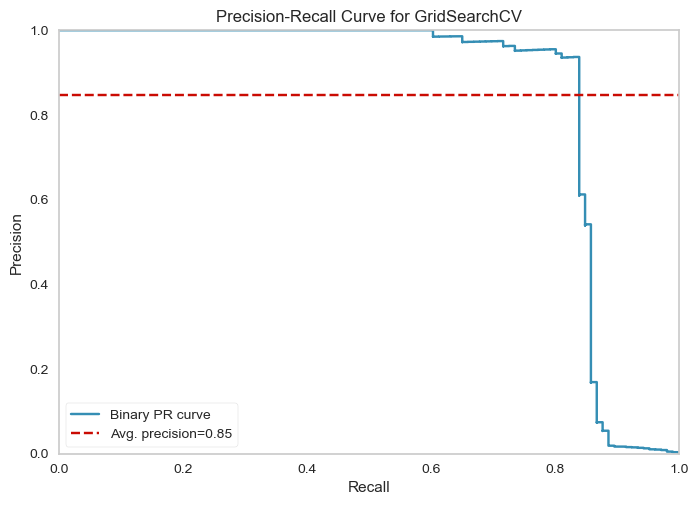

In [62]:
from yellowbrick.classifier import PrecisionRecallCurve

viz = PrecisionRecallCurve(
    grid_rfcwc_model,
    per_class=True,
    cmap="Set1"
)
viz.fit(X_train, y_train)
viz.score(X_test, y_test)
viz.show();

TEST REPORT
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56519
           1       0.94      0.84      0.89       106

    accuracy                           1.00     56625
   macro avg       0.97      0.92      0.94     56625
weighted avg       1.00      1.00      1.00     56625


 -*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
TRAIN REPORT
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    226131
           1       0.86      0.82      0.84       367

    accuracy                           1.00    226498
   macro avg       0.93      0.91      0.92    226498
weighted avg       1.00      1.00      1.00    226498



,accuracy_test,f1_test,recall_test,precision_test,accuracy_train,f1_train,recall_train,precision_train
Random Forest with CW,1.00,0.89,0.84,0.94,1.00,0.84,0.82,0.86


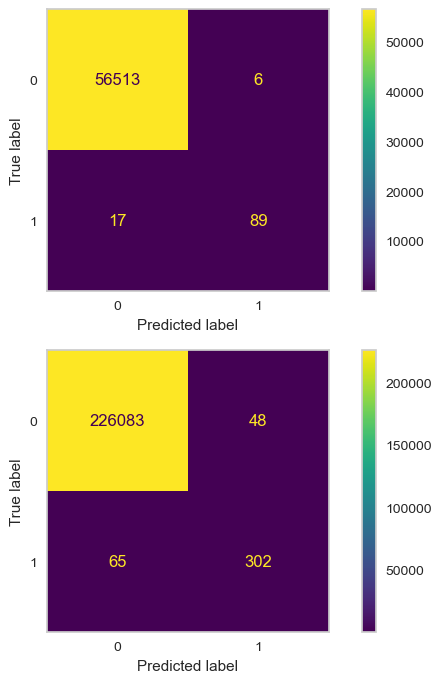

In [63]:
out_score_rfcwc = eval_metric_classification(
    grid_rfcwc_model, X_train, y_train, X_test, y_test, 
    'Random Forest with CW', average=None, labels=[1]
)
out_score_rfcwc

In [64]:
# with bootstrap class weighting
rf_model_b = RandomForestClassifier(n_estimators=5, max_features=2, class_weight='balanced_subsample', random_state=101)
rf_model_b.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced_subsample', max_features=2,
                       n_estimators=5, random_state=101)

In [65]:
eval_metric(rf_model_b, X_train, y_train, X_test, y_test) 

Test_Set
[[56518     1]
 [   31    75]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56519
           1       0.99      0.71      0.82       106

    accuracy                           1.00     56625
   macro avg       0.99      0.85      0.91     56625
weighted avg       1.00      1.00      1.00     56625


Train_Set
[[226131      0]
 [    20    347]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    226131
           1       1.00      0.95      0.97       367

    accuracy                           1.00    226498
   macro avg       1.00      0.97      0.99    226498
weighted avg       1.00      1.00      1.00    226498



In [66]:
# reset the model

model = RandomForestClassifier(random_state=random_state, class_weight='balanced_subsample')

#Apply StratifiedKFold splitting strategy as cross validate object in GridSearch
skf = StratifiedKFold(n_splits=5, random_state=random_state, shuffle=True)

# define grid parameters
param_grid = {
            "n_estimators":[20,50],
            "criterion":["entropy","gini"],
            "max_features":['auto',"log2"],
            "max_depth": [2,3,5]
           }

# built RF grid model
grid_rf_model_b = GridSearchCV(estimator=model,
                          param_grid=param_grid,
                          scoring="recall",
                          cv=skf,
                          n_jobs = -1)

In [67]:
grid_rf_model_b.fit(X_train, y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=101, shuffle=True),
             estimator=RandomForestClassifier(class_weight='balanced_subsample',
                                              random_state=101),
             n_jobs=-1,
             param_grid={'criterion': ['entropy', 'gini'],
                         'max_depth': [2, 3, 5],
                         'max_features': ['auto', 'log2'],
                         'n_estimators': [20, 50]},
             scoring='recall')

In [68]:
eval_metric(grid_rf_model_b, X_train, y_train, X_test, y_test) 

Test_Set
[[56195   324]
 [   14    92]]
              precision    recall  f1-score   support

           0       1.00      0.99      1.00     56519
           1       0.22      0.87      0.35       106

    accuracy                           0.99     56625
   macro avg       0.61      0.93      0.67     56625
weighted avg       1.00      0.99      1.00     56625


Train_Set
[[224788   1343]
 [    43    324]]
              precision    recall  f1-score   support

           0       1.00      0.99      1.00    226131
           1       0.19      0.88      0.32       367

    accuracy                           0.99    226498
   macro avg       0.60      0.94      0.66    226498
weighted avg       1.00      0.99      1.00    226498



***iii. Plot Precision and Recall Curve***

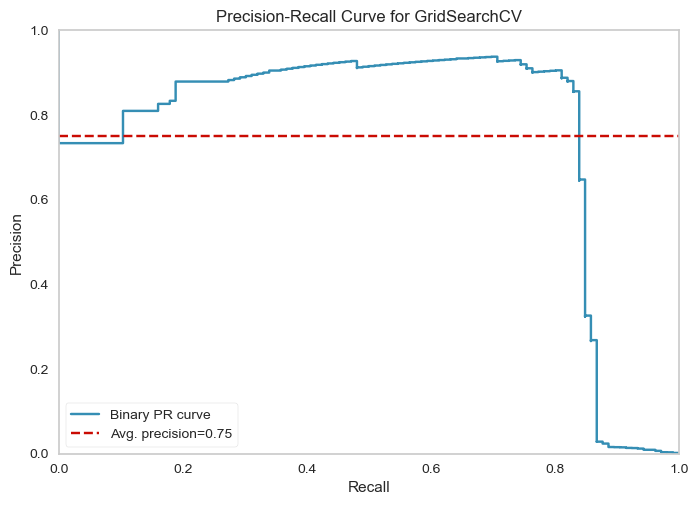

In [69]:
from yellowbrick.classifier import PrecisionRecallCurve

viz = PrecisionRecallCurve(
    grid_rf_model_b,
    per_class=True,
    cmap="Set1"
)
viz.fit(X_train, y_train)
viz.score(X_test, y_test)
viz.show();

***iv. Prediction***

TEST REPORT
              precision    recall  f1-score   support

           0       1.00      0.99      1.00     56519
           1       0.22      0.87      0.35       106

    accuracy                           0.99     56625
   macro avg       0.61      0.93      0.67     56625
weighted avg       1.00      0.99      1.00     56625


 -*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
TRAIN REPORT
              precision    recall  f1-score   support

           0       1.00      0.99      1.00    226131
           1       0.19      0.88      0.32       367

    accuracy                           0.99    226498
   macro avg       0.60      0.94      0.66    226498
weighted avg       1.00      0.99      1.00    226498



,accuracy_test,f1_test,recall_test,precision_test,accuracy_train,f1_train,recall_train,precision_train
Random Forest with Subsample_Balanced,0.99,0.35,0.87,0.22,0.99,0.32,0.88,0.19


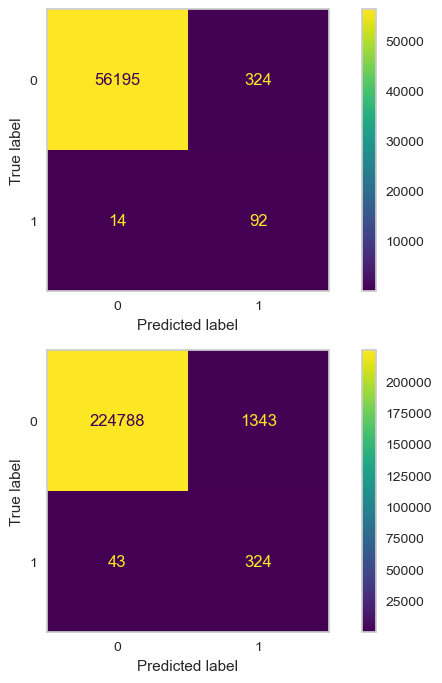

In [70]:
out_score_rf_model_b = eval_metric_classification(
    grid_rf_model_b, X_train, y_train, X_test, y_test, 
    'Random Forest with Subsample_Balanced', average=None, labels=[1]
)
out_score_rf_model_b

***v. Apply Model Evaluation Checks***
* link : https://docs.deepchecks.com/stable/user-guide/tabular/auto_quickstarts/plot_quick_model_evaluation.html

In [71]:
train_ds = Dataset(pd.DataFrame(X_train_scaled, index=y_train.index, columns=X_train.columns), label=y_train, cat_features=[])
test_ds = Dataset(pd.DataFrame(X_test_scaled, index=y_test.index, columns=X_test.columns), label=y_test, cat_features=[])

In [72]:
evaluation_suite = model_evaluation()
suite_result = evaluation_suite.run(train_ds, test_ds, grid_rfcwc_model)
# Note: the result can be saved as html using suite_result.save_as_html()
# or exported to json using suite_result.to_json()
suite_result.show()

deepchecks - WARNING - Could not find built-in feature importance on the model, using permutation feature importance calculation instead
deepchecks - INFO - Calculating permutation feature importance. Expected to finish in 19 seconds


Accordion(children=(VBox(children=(HTML(value='\n            <h1 id="summary_HE6STVE9FSP6ISUSS6WBDDS0F">Model …

#### Apply SMOTE

In [73]:
over = SMOTE(sampling_strategy={1: 500})
under = RandomUnderSampler(sampling_strategy={0: 180000})

# We are configuring our pipeline steps
steps = [("over",over),("under",under)]
pipeline = imbpipeline(steps = steps)
X_resampled, y_resampled = pipeline.fit_resample(X_train,y_train)

In [74]:
# without class_weight parameter
smote_rf= RandomForestClassifier(random_state= random_state)
smote_rf.fit(X_resampled, y_resampled)

RandomForestClassifier(random_state=101)

In [75]:
eval_metric(smote_rf, X_resampled, y_resampled, X_test, y_test) 

Test_Set
[[56513     6]
 [   18    88]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56519
           1       0.94      0.83      0.88       106

    accuracy                           1.00     56625
   macro avg       0.97      0.92      0.94     56625
weighted avg       1.00      1.00      1.00     56625


Train_Set
[[180000      0]
 [     0    500]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    180000
           1       1.00      1.00      1.00       500

    accuracy                           1.00    180500
   macro avg       1.00      1.00      1.00    180500
weighted avg       1.00      1.00      1.00    180500



In [76]:
from sklearn.model_selection import StratifiedKFold 
from sklearn.model_selection import cross_validate

skf = StratifiedKFold(n_splits=3, random_state=random_state, shuffle=True)

model = RandomForestClassifier(random_state= random_state)

scores = cross_validate(model, X_resampled, y_resampled,scoring = ["accuracy", "f1", "recall", "precision"], cv = skf)
df_scores =  pd.DataFrame.from_dict(scores, orient='columns')
display(df_scores)
df_scores.mean()[2:]

,fit_time,score_time,test_accuracy,test_f1,test_recall,test_precision
0,58.32,0.42,1.00,0.87,0.78,0.98
1,57.07,0.42,1.00,0.85,0.80,0.91
2,56.86,0.42,1.00,0.86,0.82,0.91


test_accuracy    1.00
test_f1          0.86
test_recall      0.80
test_precision   0.93
dtype: float64

***i. Prediction and Model Evaluating (Apply StratifiedKFold) and Tuning***

In [77]:
# reset the model
model = RandomForestClassifier(random_state= random_state)

#Apply StratifiedKFold splitting strategy as cross validate object in GridSearch
skf = StratifiedKFold(n_splits=5, random_state=random_state, shuffle=True)

# define grid parameters
param_grid = {
            "n_estimators":[50],
            "criterion":["entropy","gini"],
            "max_features":['auto',"log2"],
            "min_impurity_decrease": [0.0001]
           }

# built RF grid model
grid_rfsmote_model = GridSearchCV(estimator=model,
                          param_grid=param_grid,
                          scoring="recall",
                          cv=skf,
                          n_jobs = -1)
grid_rfsmote_model.fit(X_resampled, y_resampled)
grid_rfsmote_model.best_params_

{'criterion': 'entropy',
 'max_features': 'auto',
 'min_impurity_decrease': 0.0001,
 'n_estimators': 50}

In [78]:
eval_metric(grid_rfsmote_model, X_resampled, y_resampled, X_test, y_test) 

Test_Set
[[56514     5]
 [   18    88]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56519
           1       0.95      0.83      0.88       106

    accuracy                           1.00     56625
   macro avg       0.97      0.92      0.94     56625
weighted avg       1.00      1.00      1.00     56625


Train_Set
[[179978     22]
 [   101    399]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    180000
           1       0.95      0.80      0.87       500

    accuracy                           1.00    180500
   macro avg       0.97      0.90      0.93    180500
weighted avg       1.00      1.00      1.00    180500



***ii. Plot Precision and Recall Curve***

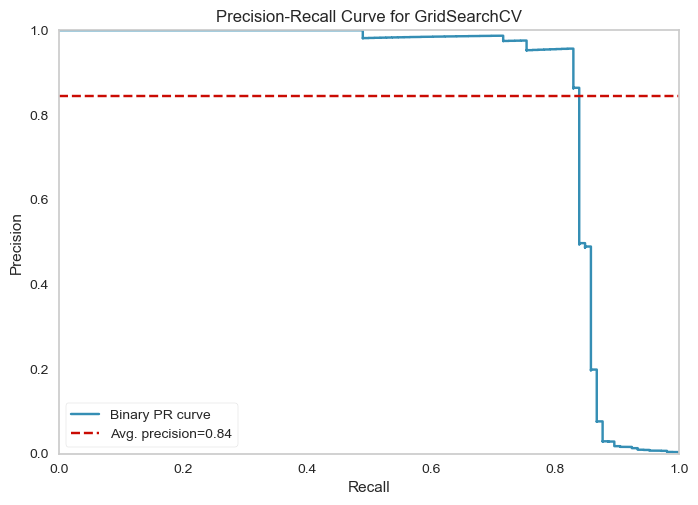

In [79]:
from yellowbrick.classifier import PrecisionRecallCurve

viz = PrecisionRecallCurve(
    estimator=grid_rfsmote_model,
    classes=grid_rfsmote_model.classes_, 
    per_class=True,
    cmap="Set1"
)
viz.fit(X_resampled, y_resampled)
viz.score(X_test, y_test)
viz.show();
# for class 1

***iii. Prediction***

TEST REPORT
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56519
           1       0.95      0.83      0.88       106

    accuracy                           1.00     56625
   macro avg       0.97      0.92      0.94     56625
weighted avg       1.00      1.00      1.00     56625


 -*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
TRAIN REPORT
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    180000
           1       0.95      0.80      0.87       500

    accuracy                           1.00    180500
   macro avg       0.97      0.90      0.93    180500
weighted avg       1.00      1.00      1.00    180500



,accuracy_test,f1_test,recall_test,precision_test,accuracy_train,f1_train,recall_train,precision_train
Random Forest with Smote,1.00,0.88,0.83,0.95,1.00,0.87,0.80,0.95


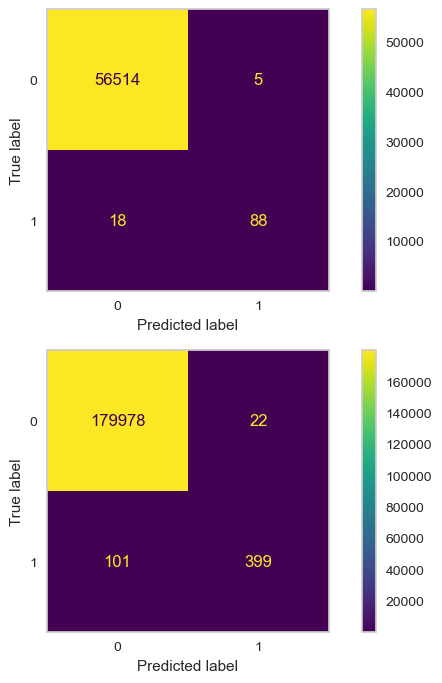

In [80]:
out_score_rfsmote = eval_metric_classification(
    grid_rfsmote_model, X_resampled, y_resampled, X_test, y_test, 
    'Random Forest with Smote', average=None, labels=[1]
)
out_score_rfsmote

***iv. Apply Model Evaluation Checks***
* link : https://docs.deepchecks.com/stable/user-guide/tabular/auto_quickstarts/plot_quick_model_evaluation.html

In [81]:
train_ds = Dataset(pd.DataFrame(X_train_scaled, index=y_train.index, columns=X_train.columns), label=y_train, cat_features=[])
test_ds = Dataset(pd.DataFrame(X_test_scaled, index=y_test.index, columns=X_test.columns), label=y_test, cat_features=[])

In [82]:
evaluation_suite = model_evaluation()
suite_result = evaluation_suite.run(train_ds, test_ds, grid_rfsmote_model)
# Note: the result can be saved as html using suite_result.save_as_html()
# or exported to json using suite_result.to_json()
suite_result.show()

deepchecks - WARNING - Could not find built-in feature importance on the model, using permutation feature importance calculation instead
deepchecks - INFO - Calculating permutation feature importance. Expected to finish in 28 seconds


Accordion(children=(VBox(children=(HTML(value='\n            <h1 id="summary_I26ZCAZAR18SEHMUT5VDV5K5Z">Model …

### XGBoost Classifier with Unbalanced Data Techniques

- The steps you are going to cover for this algorithm are as follows:

   *i. Model Training*
   
   *ii. Prediction and Model Evaluating (Apply StratifiedKFold) and Tuning*
   
   *iii. Plot Precision and Recall Curve*
   

#### Apply Class Weight

***i. Model Training***

In [83]:
from sklearn.utils import class_weight
sample_weight = class_weight.compute_sample_weight(class_weight={0: 1, 1: 2}, y=y_train)
np.unique(sample_weight)

array([1., 2.])

In [84]:
from xgboost import XGBClassifier
# with customized class_weight
xgb_model_cwc = XGBClassifier(random_state=random_state)
xgb_model_cwc.fit(X_train,y_train,sample_weight=sample_weight)

XGBClassifier(random_state=101)

In [85]:
eval_metric(xgb_model_cwc, X_train, y_train, X_test, y_test) 

Test_Set
[[56515     4]
 [   20    86]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56519
           1       0.96      0.81      0.88       106

    accuracy                           1.00     56625
   macro avg       0.98      0.91      0.94     56625
weighted avg       1.00      1.00      1.00     56625


Train_Set
[[226112     19]
 [    60    307]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    226131
           1       0.94      0.84      0.89       367

    accuracy                           1.00    226498
   macro avg       0.97      0.92      0.94    226498
weighted avg       1.00      1.00      1.00    226498



***ii. Model Evaluating (Apply StratifiedKFold) and Tuning***

In [86]:
from sklearn.model_selection import cross_validate 
from sklearn.model_selection import StratifiedKFold

skf = StratifiedKFold(n_splits=5, random_state=random_state, shuffle=True)

model = XGBClassifier(random_state=random_state)

scores = cross_validate(model, X_train, y_train,
                        scoring = ["accuracy", "f1", "recall", "precision"], cv = skf,
                        fit_params={"sample_weight":sample_weight})

df_scores =  pd.DataFrame.from_dict(scores, orient='columns')
display(df_scores)
df_scores.mean()[2:]

,fit_time,score_time,test_accuracy,test_f1,test_recall,test_precision
0,32.03,0.11,1.00,0.85,0.81,0.89
1,32.35,0.11,1.00,0.83,0.80,0.87
2,31.02,0.10,1.00,0.84,0.77,0.92
3,30.53,0.09,1.00,0.81,0.79,0.82
4,31.94,0.11,1.00,0.81,0.78,0.85


test_accuracy    1.00
test_f1          0.83
test_recall      0.79
test_precision   0.87
dtype: float64

In [87]:
# reset the model
model = XGBClassifier(random_state= random_state)

#Apply StratifiedKFold splitting strategy as cross validate object in GridSearch
skf = StratifiedKFold(n_splits=5, random_state=random_state, shuffle=True)

# define grid parameters
param_grid = {
              "n_estimators":[20,50],
              'max_depth':[2,3],
              "learning_rate": [0.05,0.1]
             }


# built XGBoost grid model
grid_xgbcwc_model = GridSearchCV(estimator=model,
                          param_grid=param_grid,
                          scoring="recall",
                          cv=skf,
                          n_jobs = -1)
grid_xgbcwc_model.fit(X_train,y_train,sample_weight=sample_weight)
grid_xgbcwc_model.best_params_

{'learning_rate': 0.05, 'max_depth': 3, 'n_estimators': 20}

In [88]:
eval_metric(grid_xgbcwc_model, X_train, y_train, X_test, y_test)

Test_Set
[[56506    13]
 [   20    86]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56519
           1       0.87      0.81      0.84       106

    accuracy                           1.00     56625
   macro avg       0.93      0.91      0.92     56625
weighted avg       1.00      1.00      1.00     56625


Train_Set
[[226063     68]
 [    67    300]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    226131
           1       0.82      0.82      0.82       367

    accuracy                           1.00    226498
   macro avg       0.91      0.91      0.91    226498
weighted avg       1.00      1.00      1.00    226498



***iii. Plot Precision and Recall Curve***


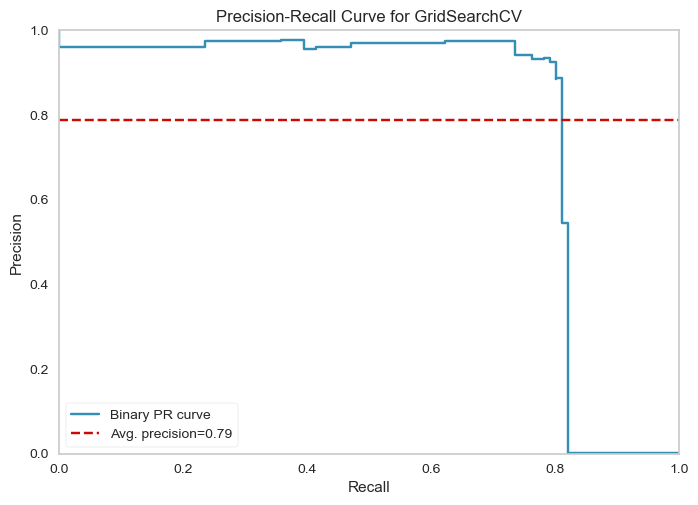

In [89]:
from yellowbrick.classifier import PrecisionRecallCurve

viz = PrecisionRecallCurve(
    grid_xgbcwc_model,
    per_class=True,
    cmap="Set1"
)
viz.fit(X_train, y_train)
viz.score(X_test, y_test)
viz.show();

***iv. Predicition***

TEST REPORT
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56519
           1       0.87      0.81      0.84       106

    accuracy                           1.00     56625
   macro avg       0.93      0.91      0.92     56625
weighted avg       1.00      1.00      1.00     56625


 -*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
TRAIN REPORT
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    226131
           1       0.82      0.82      0.82       367

    accuracy                           1.00    226498
   macro avg       0.91      0.91      0.91    226498
weighted avg       1.00      1.00      1.00    226498



,accuracy_test,f1_test,recall_test,precision_test,accuracy_train,f1_train,recall_train,precision_train
XGBoost with CW,1.00,0.84,0.81,0.87,1.00,0.82,0.82,0.82


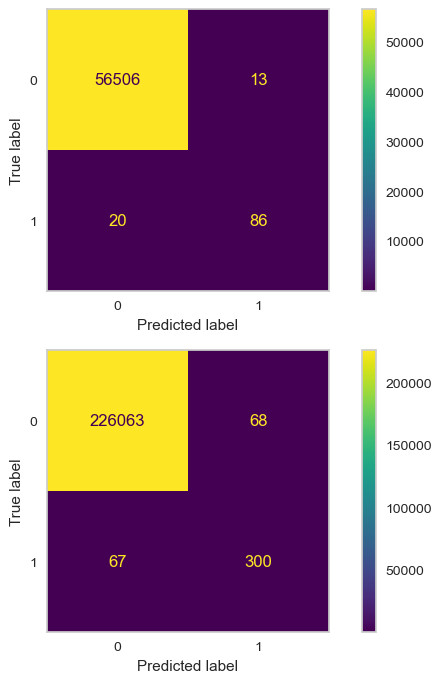

In [90]:
out_score_xgbcwc = eval_metric_classification(
    grid_xgbcwc_model, X_train, y_train, X_test, y_test, 
    'XGBoost with CW', average=None, labels=[1]
)
out_score_xgbcwc

***v. Apply Model Evaluation Checks***
* link : https://docs.deepchecks.com/stable/user-guide/tabular/auto_quickstarts/plot_quick_model_evaluation.html

In [91]:
train_ds = Dataset(pd.DataFrame(X_train_scaled, index=y_train.index, columns=X_train.columns), label=y_train, cat_features=[])
test_ds = Dataset(pd.DataFrame(X_test_scaled, index=y_test.index, columns=X_test.columns), label=y_test, cat_features=[])

In [93]:
evaluation_suite = model_evaluation()
suite_result = evaluation_suite.run(train_ds, test_ds, grid_xgbcwc_model)
# Note: the result can be saved as html using suite_result.save_as_html()
# or exported to json using suite_result.to_json()
suite_result.show()

deepchecks - WARNING - Could not find built-in feature importance on the model, using permutation feature importance calculation instead
deepchecks - INFO - Calculating permutation feature importance. Expected to finish in 18 seconds


Accordion(children=(VBox(children=(HTML(value='\n            <h1 id="summary_E7FW9I22A68XJ50RAAP9SS1G9">Model …

#### Apply SMOTE

In [94]:
over = SMOTE(sampling_strategy={1: 500})
under = RandomUnderSampler(sampling_strategy={0: 180000})

# We are configuring our pipeline steps
steps = [("over",over),("under",under)]
pipeline = imbpipeline(steps = steps)

X_resampled, y_resampled = pipeline.fit_resample(X_train,y_train)

In [95]:
# without class_weight parameter
smote_xgb= XGBClassifier(random_state= random_state)
smote_xgb.fit(X_resampled, y_resampled)

XGBClassifier(random_state=101)

In [96]:
eval_metric(smote_xgb, X_resampled, y_resampled, X_test, y_test)

Test_Set
[[56514     5]
 [   18    88]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56519
           1       0.95      0.83      0.88       106

    accuracy                           1.00     56625
   macro avg       0.97      0.92      0.94     56625
weighted avg       1.00      1.00      1.00     56625


Train_Set
[[179988     12]
 [    78    422]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    180000
           1       0.97      0.84      0.90       500

    accuracy                           1.00    180500
   macro avg       0.99      0.92      0.95    180500
weighted avg       1.00      1.00      1.00    180500



In [97]:
from sklearn.model_selection import StratifiedKFold 
from sklearn.model_selection import cross_val_score

skf = StratifiedKFold(n_splits=3, random_state=random_state, shuffle=True)

model = XGBClassifier(random_state= random_state)

scores = cross_validate(model, X_resampled, y_resampled,scoring = ["accuracy", "f1", "recall", "precision"], cv = skf)
df_scores =  pd.DataFrame.from_dict(scores, orient='columns')
display(df_scores)
df_scores.mean()[2:]

,fit_time,score_time,test_accuracy,test_f1,test_recall,test_precision
0,21.24,0.14,1.00,0.88,0.81,0.96
1,21.22,0.14,1.00,0.86,0.81,0.91
2,20.26,0.14,1.00,0.84,0.81,0.88


test_accuracy    1.00
test_f1          0.86
test_recall      0.81
test_precision   0.92
dtype: float64

***ii. Prediction and Model Evaluating (Apply StratifiedKFold) and Tuning***

In [98]:
# reset the model
model = XGBClassifier(random_state= random_state)

#Apply StratifiedKFold splitting strategy as cross validate object in GridSearch
skf = StratifiedKFold(n_splits=3, random_state=random_state, shuffle=True)

# define grid parameters
param_grid = {
              "n_estimators":[50,75],
              'max_depth':[2,3],
              "learning_rate": [0.05,0.1]
             }


# built XGBoost grid model
grid_xgbsmote_model = GridSearchCV(estimator=model,
                          param_grid=param_grid,
                          scoring="recall",
                          cv=skf,
                          n_jobs = -1)
grid_xgbsmote_model.fit(X_resampled, y_resampled)
grid_xgbsmote_model.best_params_

{'learning_rate': 0.05, 'max_depth': 3, 'n_estimators': 75}

In [99]:
eval_metric(grid_xgbsmote_model, X_resampled, y_resampled, X_test, y_test) 

Test_Set
[[56511     8]
 [   19    87]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56519
           1       0.92      0.82      0.87       106

    accuracy                           1.00     56625
   macro avg       0.96      0.91      0.93     56625
weighted avg       1.00      1.00      1.00     56625


Train_Set
[[179967     33]
 [    81    419]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    180000
           1       0.93      0.84      0.88       500

    accuracy                           1.00    180500
   macro avg       0.96      0.92      0.94    180500
weighted avg       1.00      1.00      1.00    180500



***iv.  Plot Precision and Recall Curve***

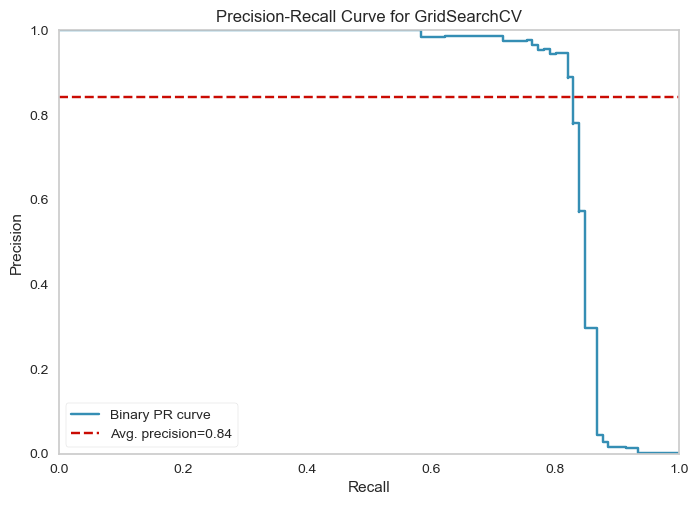

In [100]:
from yellowbrick.classifier import PrecisionRecallCurve

viz = PrecisionRecallCurve(
    estimator=grid_xgbsmote_model,
    classes=grid_xgbsmote_model.classes_, 
    per_class=True,
    cmap="Set1"
)
viz.fit(X_resampled, y_resampled)
viz.score(X_test, y_test)
viz.show();
# for class 1

***v. Prediction***

TEST REPORT
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56519
           1       0.92      0.82      0.87       106

    accuracy                           1.00     56625
   macro avg       0.96      0.91      0.93     56625
weighted avg       1.00      1.00      1.00     56625


 -*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
TRAIN REPORT
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    180000
           1       0.93      0.84      0.88       500

    accuracy                           1.00    180500
   macro avg       0.96      0.92      0.94    180500
weighted avg       1.00      1.00      1.00    180500



,accuracy_test,f1_test,recall_test,precision_test,accuracy_train,f1_train,recall_train,precision_train
XGBoost with Smote,1.00,0.87,0.82,0.92,1.00,0.88,0.84,0.93


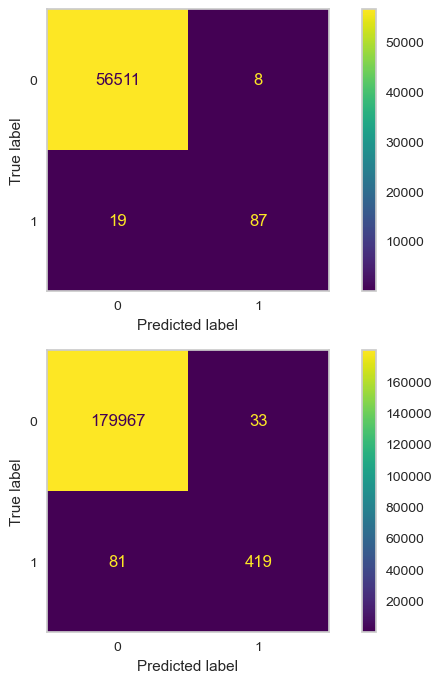

In [101]:
out_score_xgbsmote = eval_metric_classification(
    grid_xgbsmote_model, X_resampled, y_resampled, X_test, y_test, 
    'XGBoost with Smote', average=None, labels=[1]
)
out_score_xgbsmote

***v. Apply Model Evaluation Checks***
* link : https://docs.deepchecks.com/stable/user-guide/tabular/auto_quickstarts/plot_quick_model_evaluation.html

In [102]:
train_ds = Dataset(pd.DataFrame(X_train_scaled, index=y_train.index, columns=X_train.columns), label=y_train, cat_features=[])
test_ds = Dataset(pd.DataFrame(X_test_scaled, index=y_test.index, columns=X_test.columns), label=y_test, cat_features=[])

In [103]:
evaluation_suite = model_evaluation()
suite_result = evaluation_suite.run(train_ds, test_ds, grid_xgbsmote_model)
# Note: the result can be saved as html using suite_result.save_as_html()
# or exported to json using suite_result.to_json()
suite_result.show()

deepchecks - WARNING - Could not find built-in feature importance on the model, using permutation feature importance calculation instead
deepchecks - INFO - Calculating permutation feature importance. Expected to finish in 19 seconds


Accordion(children=(VBox(children=(HTML(value='\n            <h1 id="summary_M20QPAAM6J68DDE66ZF7SRR4G">Model …

### Neural Network

In the final step, you will make classification with Neural Network which is a Deep Learning algorithm. 

Neural networks are a series of algorithms that mimic the operations of a human brain to recognize relationships between vast amounts of data. They are used in a variety of applications in financial services, from forecasting and marketing research to fraud detection and risk assessment.

A neural network contains layers of interconnected nodes. Each node is a perceptron and is similar to a multiple linear regression. The perceptron feeds the signal produced by a multiple linear regression into an activation function that may be nonlinear.

In a multi-layered perceptron (MLP), perceptrons are arranged in interconnected layers. The input layer collects input patterns. The output layer has classifications or output signals to which input patterns may map. 

Hidden layers fine-tune the input weightings until the neural network’s margin of error is minimal. It is hypothesized that hidden layers extrapolate salient features in the input data that have predictive power regarding the outputs.

You will discover **[how to create](https://towardsdatascience.com/building-our-first-neural-network-in-keras-bdc8abbc17f5)** your deep learning neural network model in Python using **[Keras](https://keras.io/about/)**. Keras is a powerful and easy-to-use free open source Python library for developing and evaluating deep learning models.

- The steps you are going to cover for this algorithm are as follows:

   *i. Import Libraries*
   
   *ii. Define Model*
    
   *iii. Compile Model*
   
   *iv. Fit Model*
   
   *v. Prediction and Model Evaluating*
   
   *vi. Plot Precision and Recall Curve*

In [104]:
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2, random_state=random_state)
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

***i. Import Libraries***

In [105]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, BatchNormalization, MaxPool2D, MaxPooling2D, Flatten, Dense, Activation, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam, Adadelta, RMSprop, Nadam
# from keras.optimizers import Adam, Nadam, RMSprop, Nadam

# !pip install scikeras[tensorflow]
from scikeras.wrappers import KerasClassifier, KerasRegressor
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier # deprecated


from sklearn.metrics import  SCORERS, classification_report, confusion_matrix
from sklearn.metrics import roc_auc_score, roc_curve, plot_roc_curve
from sklearn.metrics import precision_recall_curve, average_precision_score

from sklearn.model_selection import cross_val_score, cross_validate
from sklearn.model_selection import GridSearchCV

***ii. Define Model***

In [106]:
tf.keras.backend.clear_session() # to reset session

# Layer Architecture Building
model = Sequential()

model.add(Dense(64, activation = "relu", input_dim = X_train.shape[1]))
# model.add(Dropout(0.2))

model.add(Dense(32, activation = "relu"))
# model.add(Dropout(0.2))

model.add(Dense(16, activation = "relu"))
# model.add(Dropout(0.2))

model.add(Dense(8, activation = "relu"))
# model.add(Dropout(0.2))

model.add(Dense(1, activation = "sigmoid"))

opt = Adam(lr = 0.001)

***iii. Compile Model***

In [107]:
model.compile(optimizer = opt, loss = "binary_crossentropy", metrics = ["Recall"])

In [108]:
early_stop = EarlyStopping(monitor = "val_loss", mode = "min", verbose = 1, patience = 5, restore_best_weights = True)

***iv. Fit Model***

In [109]:
model.fit(x= X_train_scaled,
                    y= y_train,
                    validation_split=.1,
                    batch_size=32,
                    epochs=20,
                    verbose=1,
                    callbacks = [early_stop]
                   )

Epoch 1/20
6371/6371 [==============================] - 7s 1ms/step - loss: 0.0081 - recall: 0.6402 - val_loss: 0.0031 - val_recall: 0.7949
Epoch 2/20
6371/6371 [==============================] - 7s 1ms/step - loss: 0.0031 - recall: 0.7043 - val_loss: 0.0025 - val_recall: 0.7436
Epoch 3/20
6371/6371 [==============================] - 8s 1ms/step - loss: 0.0028 - recall: 0.7165 - val_loss: 0.0025 - val_recall: 0.7692
Epoch 4/20
6371/6371 [==============================] - 7s 1ms/step - loss: 0.0025 - recall: 0.6585 - val_loss: 0.0024 - val_recall: 0.6923
Epoch 5/20
6371/6371 [==============================] - 7s 1ms/step - loss: 0.0024 - recall: 0.7043 - val_loss: 0.0024 - val_recall: 0.7949
Epoch 6/20
6371/6371 [==============================] - 7s 1ms/step - loss: 0.0023 - recall: 0.6677 - val_loss: 0.0026 - val_recall: 0.7949
Epoch 7/20
6371/6371 [==============================] - 8s 1ms/step - loss: 0.0022 - recall: 0.6890 - val_loss: 0.0031 - val_recall: 0.7692
Epoch 8/20
6371/6371

In [110]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 64)                1984      
                                                                 
 dense_1 (Dense)             (None, 32)                2080      
                                                                 
 dense_2 (Dense)             (None, 16)                528       
                                                                 
 dense_3 (Dense)             (None, 8)                 136       
                                                                 
 dense_4 (Dense)             (None, 1)                 9         
                                                                 
Total params: 4,737
Trainable params: 4,737
Non-trainable params: 0
_________________________________________________________________


In [111]:
loss_df = pd.DataFrame(model.history.history)
loss_df

,loss,recall,val_loss,val_recall
0,0.01,0.64,0.00,0.79
1,0.00,0.70,0.00,0.74
2,0.00,0.72,0.00,0.77
3,0.00,0.66,0.00,0.69
4,0.00,0.70,0.00,0.79
5,0.00,0.67,0.00,0.79
6,0.00,0.69,0.00,0.77
7,0.00,0.70,0.00,0.74
8,0.00,0.70,0.00,0.56
9,0.00,0.72,0.00,0.77


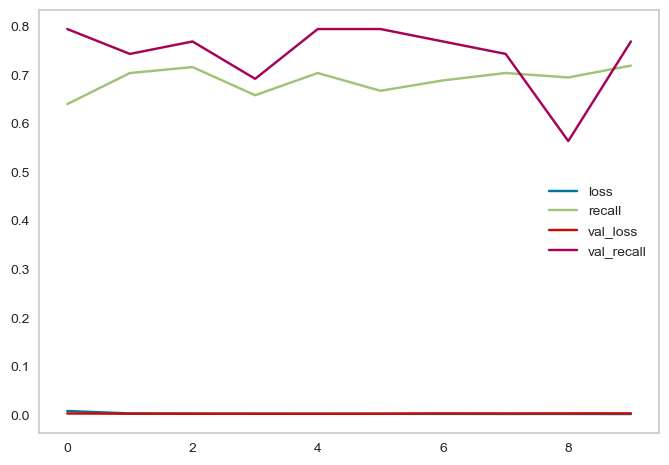

In [112]:
loss_df.plot();

***v. Prediction and Model Evaluating***

In [113]:
model.evaluate(X_test_scaled, y_test, verbose=0)

[0.0033000416588038206, 0.7924528121948242]

In [114]:
loss, recall = model.evaluate(X_test_scaled, y_test, verbose=0)
print("loss : ", loss)
print("recall : ", recall)

loss :  0.0033000416588038206
recall :  0.7924528121948242


In [115]:
y_pred_test = model.predict(X_test_scaled) > 0.5  
print(confusion_matrix(y_test, y_pred_test))
print(classification_report(y_test, y_pred_test))
print(50*"*")
y_pred_train = model.predict(X_train_scaled) > 0.5  
print(confusion_matrix(y_train, y_pred_train))
print(classification_report(y_train, y_pred_train))

1770/1770 [==============================] - 1s 714us/step
[[56515     4]
 [   22    84]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56519
           1       0.95      0.79      0.87       106

    accuracy                           1.00     56625
   macro avg       0.98      0.90      0.93     56625
weighted avg       1.00      1.00      1.00     56625

**************************************************
7079/7079 [==============================] - 5s 643us/step
[[226112     19]
 [    96    271]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    226131
           1       0.93      0.74      0.82       367

    accuracy                           1.00    226498
   macro avg       0.97      0.87      0.91    226498
weighted avg       1.00      1.00      1.00    226498



In [116]:
pickle.dump(scaler, open("scaler.pkl", 'wb'))
model.save('fraud_detection_ann.h5')

<IPython.core.display.Javascript object>

***vi. Plot Precision and Recall Curve***

1770/1770 [==============================] - 1s 674us/step


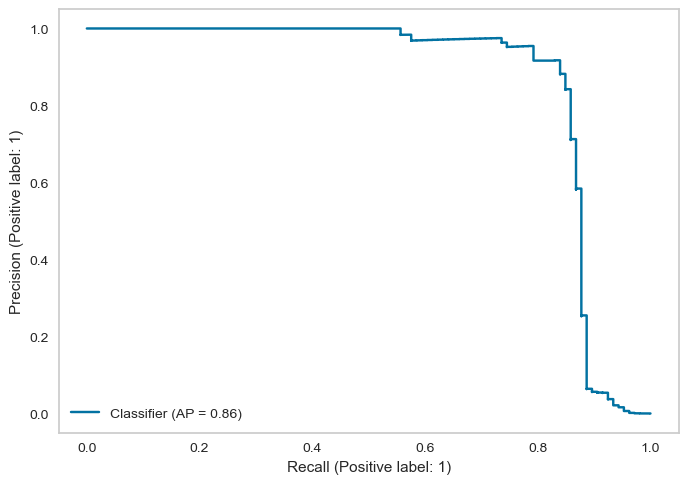

In [117]:
# plot precision recall curve

from sklearn.metrics import PrecisionRecallDisplay

y_pred_proba = model.predict(X_test_scaled)

PrecisionRecallDisplay.from_predictions(y_test, y_pred_proba)
plt.show();

***vii. Prediction***

<IPython.core.display.Javascript object>

7079/7079 [==============================] - 4s 629us/step
TEST REPORT
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56519
           1       0.95      0.79      0.87       106

    accuracy                           1.00     56625
   macro avg       0.98      0.90      0.93     56625
weighted avg       1.00      1.00      1.00     56625


 -*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
TRAIN REPORT
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    226131
           1       0.93      0.74      0.82       367

    accuracy                           1.00    226498
   macro avg       0.97      0.87      0.91    226498
weighted avg       1.00      1.00      1.00    226498



,accuracy_test,f1_test,recall_test,precision_test,accuracy_train,f1_train,recall_train,precision_train
ANN,1.00,0.87,0.79,0.95,1.00,0.82,0.74,0.93


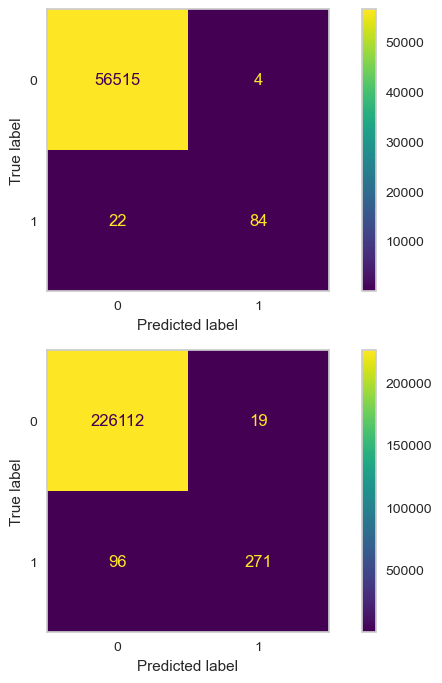

In [118]:
from tensorflow.keras.models import load_model
model_ann = load_model('fraud_detection_ann.h5')
scaler = pickle.load(open("scaler.pkl", "rb"))

out_score_ann = eval_metric_classification(
    model_ann, X_train_scaled, y_train, X_test_scaled, y_test, 
    'ANN', ml_model=False, average=None, labels=[1]
)
out_score_ann

***v. Apply Model Evaluation Checks***
* link : https://docs.deepchecks.com/stable/user-guide/tabular/auto_quickstarts/plot_quick_model_evaluation.html

In [119]:
train_ds = Dataset(pd.DataFrame(X_train_scaled, index=y_train.index, columns=X_train.columns), label=y_train, cat_features=[])
test_ds = Dataset(pd.DataFrame(X_test_scaled, index=y_test.index, columns=X_test.columns), label=y_test, cat_features=[])

In [120]:
evaluation_suite = model_evaluation()
suite_result = evaluation_suite.run(train_ds, test_ds, model_ann)
# Note: the result can be saved as html using suite_result.save_as_html()
# or exported to json using suite_result.to_json()
suite_result.show()

1770/1770 [==============================] - 1s 636us/step


1/1 [==============================] - 0s 16ms/step


deepchecks - WARNING - Could not find built-in feature importance on the model, using permutation feature importance calculation instead


313/313 [==============================] - 0s 811us/step


deepchecks - WARNING - Features importance was not calculated:
Skipping permutation importance calculation: calculation was projected to finish in 337 seconds, but timeout was configured to 120 seconds


32/32 [==============================] - 0s 1ms/step


Accordion(children=(VBox(children=(HTML(value='\n            <h1 id="summary_QJWR13Q2AVIHCSIBF5EOGC64Q">Model …

#### Apply Class Weight

***ii. Define Model***

In [121]:
model_cw = Sequential()

model_cw.add(Dense(64, input_dim = X_train_scaled.shape[1]))
model_cw.add(BatchNormalization())
model_cw.add(Activation('relu'))
model_cw.add(Dense(32))
model_cw.add(BatchNormalization())
model_cw.add(Activation('relu'))
model_cw.add(Dense(16))
model_cw.add(BatchNormalization())
model_cw.add(Activation('relu'))
model_cw.add(Dense(1, activation='sigmoid'))

***iii. Compile Model***

In [122]:
opt = Adam(lr = 0.001) 

model_cw.compile(optimizer=opt, loss='binary_crossentropy', metrics=['Recall'])

In [123]:
early_stop = EarlyStopping(monitor = "val_recall", 
                           mode = "max", 
                           verbose = 1, 
                           patience = 5,
                           restore_best_weights = True)

***iv. Fit Model***

In [124]:
model_cw.fit(x=X_train_scaled,
          y=y_train,
          validation_split=.1,
          batch_size=16,
          epochs=100,
          verbose=1,
          callbacks = [early_stop],
          class_weight={0: 1, 1: 2})

Epoch 1/100
12741/12741 [==============================] - 23s 2ms/step - loss: 0.0116 - recall: 0.6707 - val_loss: 0.0047 - val_recall: 0.8205
Epoch 2/100
12741/12741 [==============================] - 21s 2ms/step - loss: 0.0058 - recall: 0.7652 - val_loss: 0.0038 - val_recall: 0.8205
Epoch 3/100
12741/12741 [==============================] - 20s 2ms/step - loss: 0.0055 - recall: 0.7744 - val_loss: 0.0031 - val_recall: 0.7436
Epoch 4/100
12741/12741 [==============================] - 21s 2ms/step - loss: 0.0052 - recall: 0.7805 - val_loss: 0.0051 - val_recall: 0.8462
Epoch 5/100
12741/12741 [==============================] - 22s 2ms/step - loss: 0.0052 - recall: 0.7805 - val_loss: 0.0030 - val_recall: 0.8462
Epoch 6/100
12741/12741 [==============================] - 21s 2ms/step - loss: 0.0047 - recall: 0.7988 - val_loss: 0.0042 - val_recall: 0.8718
Epoch 7/100
12741/12741 [==============================] - 21s 2ms/step - loss: 0.0045 - recall: 0.8079 - val_loss: 0.0031 - val_recall:

In [125]:
model_cw.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5 (Dense)             (None, 64)                1984      
                                                                 
 batch_normalization (BatchN  (None, 64)               256       
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 64)                0         
                                                                 
 dense_6 (Dense)             (None, 32)                2080      
                                                                 
 batch_normalization_1 (Batc  (None, 32)               128       
 hNormalization)                                                 
                                                                 
 activation_1 (Activation)   (None, 32)               

In [126]:
loss_df = pd.DataFrame(model_cw.history.history)
loss_df

,loss,recall,val_loss,val_recall
0,0.01,0.67,0.00,0.82
1,0.01,0.77,0.00,0.82
2,0.01,0.77,0.00,0.74
3,0.01,0.78,0.01,0.85
4,0.01,0.78,0.00,0.85
5,0.00,0.80,0.00,0.87
6,0.00,0.81,0.00,0.85
7,0.00,0.79,0.00,0.85
8,0.00,0.81,0.00,0.85
9,0.00,0.80,0.00,0.85


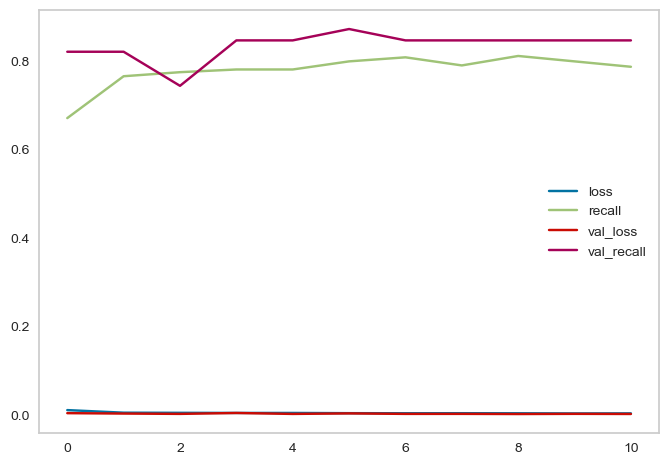

In [127]:
loss_df.plot();

***v. Prediction and Model Evaluating***

In [128]:
model_cw.evaluate(X_test_scaled, y_test, verbose=0)

[0.0051965899765491486, 0.8396226167678833]

In [129]:
loss, recall = model_cw.evaluate(X_test_scaled, y_test, verbose=0)
print("loss : ", loss)
print("recall : ", recall)

loss :  0.0051965899765491486
recall :  0.8396226167678833


In [130]:
y_pred_test = model_cw.predict(X_test_scaled) > 0.5  
print(confusion_matrix(y_test, y_pred_test))
print(classification_report(y_test, y_pred_test))
print(50*"*")
y_pred_train = model.predict(X_train_scaled) > 0.5  
print(confusion_matrix(y_train, y_pred_train))
print(classification_report(y_train, y_pred_train))

1770/1770 [==============================] - 1s 784us/step
[[56477    42]
 [   17    89]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56519
           1       0.68      0.84      0.75       106

    accuracy                           1.00     56625
   macro avg       0.84      0.92      0.88     56625
weighted avg       1.00      1.00      1.00     56625

**************************************************
7079/7079 [==============================] - 4s 627us/step
[[226112     19]
 [    96    271]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    226131
           1       0.93      0.74      0.82       367

    accuracy                           1.00    226498
   macro avg       0.97      0.87      0.91    226498
weighted avg       1.00      1.00      1.00    226498



In [131]:
pickle.dump(scaler, open("scaler.pkl", 'wb'))
model_cw.save('fraud_detection_ann_cw.h5')

<IPython.core.display.Javascript object>

In [132]:
model_ann_cw = load_model('fraud_detection_ann_cw.h5')
scaler = pickle.load(open("scaler.pkl", "rb"))

<IPython.core.display.Javascript object>

1770/1770 [==============================] - 1s 755us/step


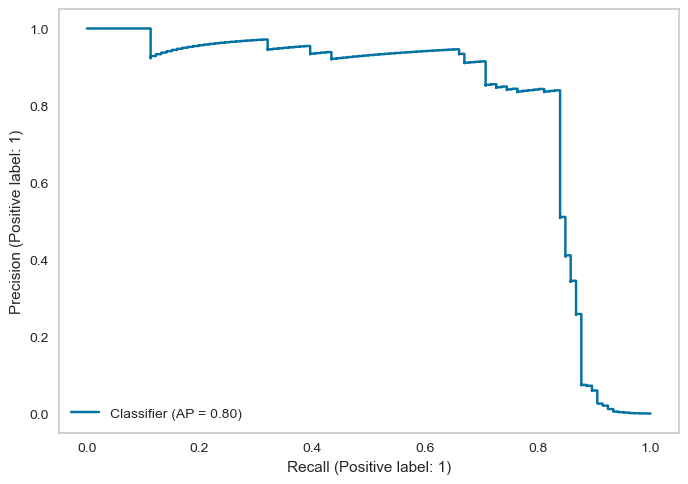

In [133]:
# plot precision recall curve

from sklearn.metrics import PrecisionRecallDisplay

y_pred_proba = model_ann_cw.predict(X_test_scaled)

PrecisionRecallDisplay.from_predictions(y_test, y_pred_proba)
plt.show();

7079/7079 [==============================] - 5s 678us/step
TEST REPORT
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56519
           1       0.68      0.84      0.75       106

    accuracy                           1.00     56625
   macro avg       0.84      0.92      0.88     56625
weighted avg       1.00      1.00      1.00     56625


 -*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
TRAIN REPORT
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    226131
           1       0.63      0.87      0.73       367

    accuracy                           1.00    226498
   macro avg       0.82      0.94      0.87    226498
weighted avg       1.00      1.00      1.00    226498



,accuracy_test,f1_test,recall_test,precision_test,accuracy_train,f1_train,recall_train,precision_train
ANN with CW,1.00,0.75,0.84,0.68,1.00,0.73,0.87,0.63


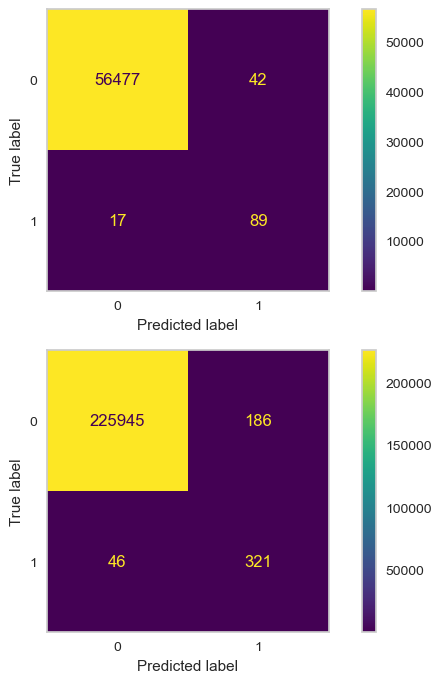

In [134]:
out_score_ann_cw = eval_metric_classification(
    model_ann_cw, X_train_scaled, y_train, X_test_scaled, y_test, 
    'ANN with CW', ml_model=False, average=None, labels=[1]
)
out_score_ann_cw

***v. Apply Model Evaluation Checks***
* link : https://docs.deepchecks.com/stable/user-guide/tabular/auto_quickstarts/plot_quick_model_evaluation.html

In [135]:
train_ds = Dataset(pd.DataFrame(X_train_scaled, index=y_train.index, columns=X_train.columns), label=y_train, cat_features=[])
test_ds = Dataset(pd.DataFrame(X_test_scaled, index=y_test.index, columns=X_test.columns), label=y_test, cat_features=[])

In [136]:
evaluation_suite = model_evaluation()
suite_result = evaluation_suite.run(train_ds, test_ds, model_ann_cw)
# Note: the result can be saved as html using suite_result.save_as_html()
# or exported to json using suite_result.to_json()
suite_result.show()

1770/1770 [==============================] - 1s 713us/step


1/1 [==============================] - 0s 16ms/step


deepchecks - WARNING - Could not find built-in feature importance on the model, using permutation feature importance calculation instead


313/313 [==============================] - 0s 921us/step


deepchecks - WARNING - Features importance was not calculated:
Skipping permutation importance calculation: calculation was projected to finish in 348 seconds, but timeout was configured to 120 seconds


32/32 [==============================] - 0s 1ms/step


Accordion(children=(VBox(children=(HTML(value='\n            <h1 id="summary_0Y4DGK00NFTGL72YZLFKQIZ55">Model …

### Model Comparison

In [137]:
compare = pd.concat([
    out_score_log,
    out_score_log_cwc,
    out_score_log_smote,
    out_score_rfcwc,
    out_score_rf_model_b,
    out_score_rfsmote,
    out_score_xgbcwc,
    out_score_xgbsmote,
    out_score_ann,
    out_score_ann_cw
])
compare

,accuracy_test,f1_test,recall_test,precision_test,accuracy_train,f1_train,recall_train,precision_train
Logistic Regression,1.00,0.70,0.58,0.87,1.00,0.69,0.59,0.84
Logistic Regression with CW,1.00,0.83,0.83,0.82,1.00,0.78,0.80,0.77
Logistic Regression with SMOTE,1.00,0.75,0.71,0.81,1.00,0.74,0.69,0.80
Random Forest with CW,1.00,0.89,0.84,0.94,1.00,0.84,0.82,0.86
Random Forest with Subsample_Balanced,0.99,0.35,0.87,0.22,0.99,0.32,0.88,0.19
Random Forest with Smote,1.00,0.88,0.83,0.95,1.00,0.87,0.80,0.95
XGBoost with CW,1.00,0.84,0.81,0.87,1.00,0.82,0.82,0.82
XGBoost with Smote,1.00,0.87,0.82,0.92,1.00,0.88,0.84,0.93
ANN,1.00,0.87,0.79,0.95,1.00,0.82,0.74,0.93
ANN with CW,1.00,0.75,0.84,0.68,1.00,0.73,0.87,0.63


In [138]:
compare.to_csv('models_compare.csv')

#### Accuracy Comparison

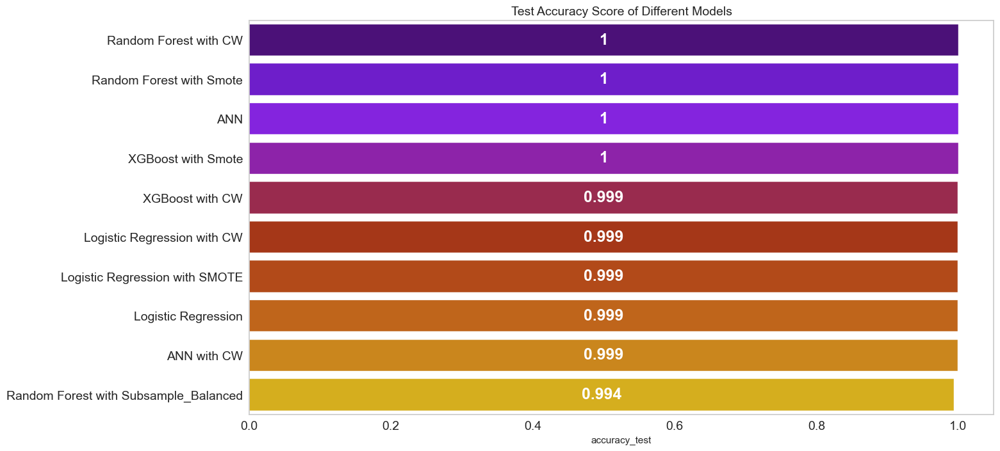

In [139]:
compare = compare.sort_values(by='accuracy_test', ascending=False)

plt.figure(figsize=(15,8))
ax = sns.barplot(x='accuracy_test', y=compare.index, data=compare.round(3), palette="gnuplot")
ax.bar_label(ax.containers[0], fontsize=18, color='w', weight='bold', label_type='center', rotation=0)

plt.title("Test Accuracy Score of Different Models", size=14)
plt.yticks(size = 14)
plt.xticks(size = 14)
plt.show()

#### Recall Score Comparison

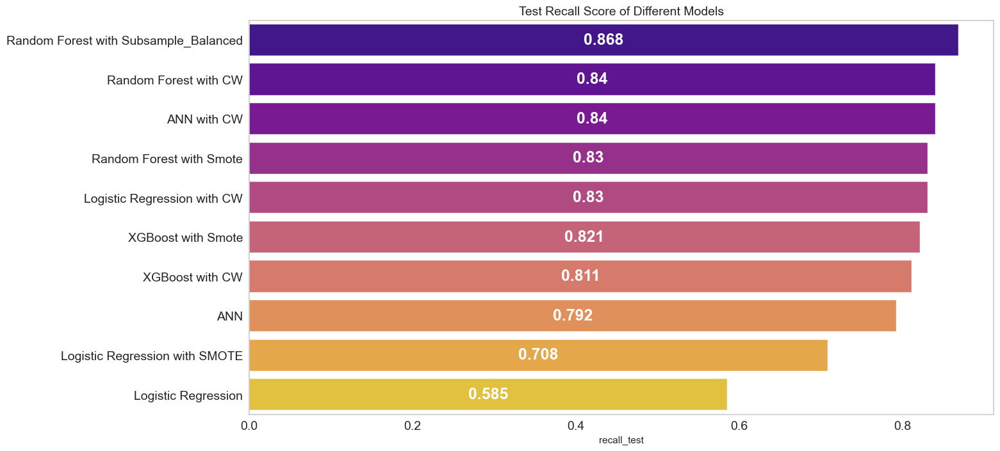

In [140]:
compare = compare.sort_values(by='recall_test', ascending=False)

plt.figure(figsize=(15,8))
ax = sns.barplot(x='recall_test', y=compare.index, data=compare.round(3), palette="plasma")
ax.bar_label(ax.containers[0], fontsize=18, color='w', weight='bold', label_type='center', rotation=0)

plt.title("Test Recall Score of Different Models", size=14)
plt.yticks(size = 14)
plt.xticks(size = 14)
plt.show()

#### F1 Score Comparison

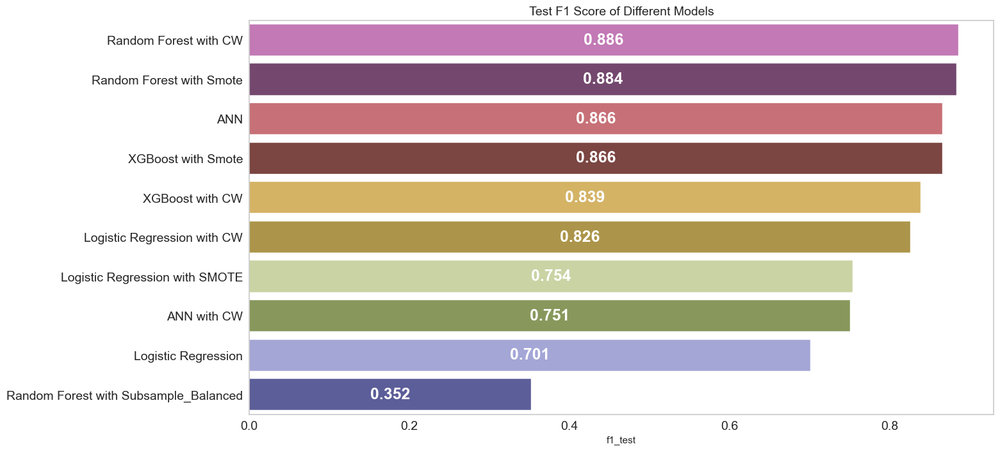

In [141]:
compare = compare.sort_values(by='f1_test', ascending=False)

plt.figure(figsize=(15,8))
ax = sns.barplot(x='f1_test', y=compare.index, data=compare.round(3), palette="tab20b_r")
ax.bar_label(ax.containers[0], fontsize=18, color='w', weight='bold', label_type='center', rotation=0)

plt.title("Test F1 Score of Different Models", size=14)
plt.yticks(size = 14)
plt.xticks(size = 14)
plt.show()

#### Precision Score Comparison

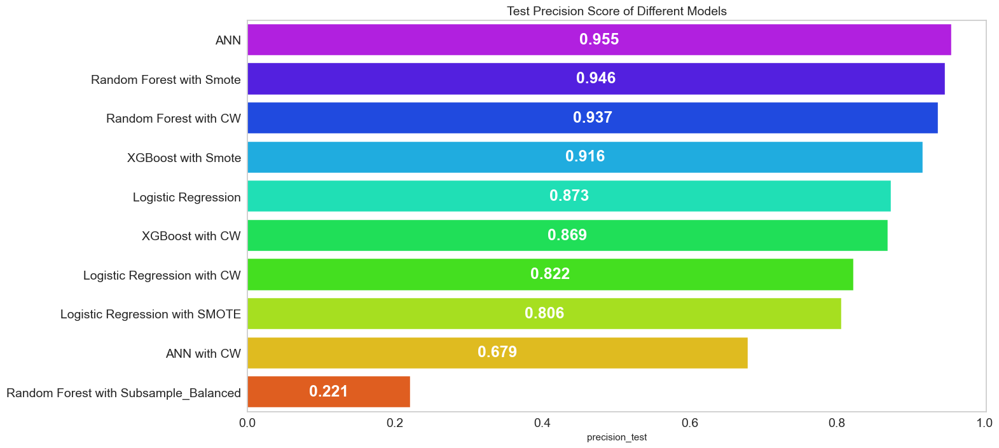

In [142]:
compare = compare.sort_values(by='precision_test', ascending=False)

plt.figure(figsize=(15,8))
ax = sns.barplot(x='precision_test', y=compare.index, data=compare.round(3), palette="gist_rainbow_r")
ax.bar_label(ax.containers[0], fontsize=18, color='w', weight='bold', label_type='center', rotation=0)

plt.title("Test Precision Score of Different Models", size=14)
plt.yticks(size = 14)
plt.xticks(size = 14)
plt.show()

### Feature Importance for Best Model

In [143]:
grid_rfcwc_model.best_params_

{'criterion': 'entropy',
 'max_depth': 5,
 'max_features': 'auto',
 'n_estimators': 50}

In [144]:
class_weights_custom = {0: 1, 1: 8}
model = RandomForestClassifier(criterion="entropy", max_depth=5, max_features="auto", n_estimators=50,
                               random_state=random_state, class_weight=class_weights_custom)

model.fit(X_train, y_train)

RandomForestClassifier(class_weight={0: 1, 1: 8}, criterion='entropy',
                       max_depth=5, max_features='auto', n_estimators=50,
                       random_state=101)

In [145]:
rf_feature_imp = pd.DataFrame(data = model.feature_importances_, index = X_train.columns,
                              columns = ["Feature Importance"]).sort_values("Feature Importance", ascending = False)
rf_feature_imp

,Feature Importance
V14,0.19
V10,0.18
V12,0.14
V17,0.12
V11,0.08
V4,0.07
V16,0.05
V3,0.05
V7,0.04
V9,0.02


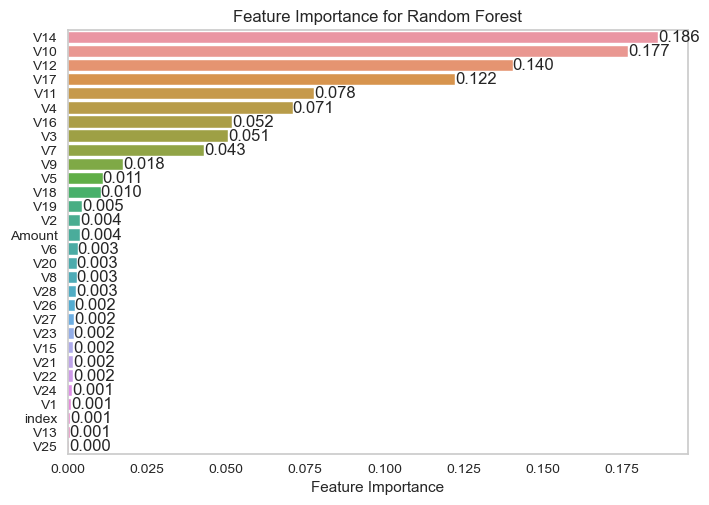

In [146]:
ax = sns.barplot(x=rf_feature_imp["Feature Importance"], y=rf_feature_imp.index)
ax.bar_label(ax.containers[0],fmt="%.3f")
plt.title("Feature Importance for Random Forest")
plt.show()

In [147]:
selected_features = rf_feature_imp[rf_feature_imp.values > 0.015]
selected_features

,Feature Importance
V14,0.19
V10,0.18
V12,0.14
V17,0.12
V11,0.08
V4,0.07
V16,0.05
V3,0.05
V7,0.04
V9,0.02


In [148]:
X = X[selected_features.index]

In [149]:
X

,V14,V10,V12,V17,V11,V4,V16,V3,V7,V9
0,-0.31,0.09,-0.62,0.21,-0.55,1.38,-0.47,2.54,0.24,0.36
1,-0.14,-0.17,1.07,-0.11,1.61,0.45,0.46,0.17,-0.08,-0.26
2,-0.17,0.21,0.07,1.11,0.62,0.38,-2.89,1.77,0.79,-1.51
3,-0.29,-0.05,0.18,-0.68,-0.23,-0.86,-1.06,1.79,0.24,-1.39
4,-1.12,0.75,0.54,-0.24,-0.82,0.40,-0.45,1.55,0.59,0.82
...,...,...,...,...,...,...,...,...,...,...
283118,4.63,4.36,2.71,1.99,-1.59,-2.07,1.11,-9.83,-4.92,1.91
283119,-0.68,-0.98,0.92,-0.03,-0.15,-0.74,-0.71,2.04,0.02,0.58
283120,-0.51,-0.48,0.06,0.31,0.41,-0.56,0.14,-3.25,-0.30,0.43
283121,0.45,-0.40,-0.96,0.51,-1.93,0.69,-0.61,0.70,-0.69,0.39


In [150]:
df_final = pd.concat([X,y], axis=1)
df_final.to_csv("Final_data.csv", index=False)

In [151]:
df_final.head()

,V14,V10,V12,V17,V11,V4,V16,V3,V7,V9,Class
0,-0.31,0.09,-0.62,0.21,-0.55,1.38,-0.47,2.54,0.24,0.36,0
1,-0.14,-0.17,1.07,-0.11,1.61,0.45,0.46,0.17,-0.08,-0.26,0
2,-0.17,0.21,0.07,1.11,0.62,0.38,-2.89,1.77,0.79,-1.51,0
3,-0.29,-0.05,0.18,-0.68,-0.23,-0.86,-1.06,1.79,0.24,-1.39,0
4,-1.12,0.75,0.54,-0.24,-0.82,0.40,-0.45,1.55,0.59,0.82,0


In [152]:
# Train test split for data containing best feaftures

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=random_state)

In [153]:
model_best_feat = RandomForestClassifier(criterion="entropy", max_depth=5, max_features="auto", n_estimators=50,
                               random_state=random_state, class_weight=class_weights_custom)

model_best_feat.fit(X_train, y_train)

RandomForestClassifier(class_weight={0: 1, 1: 8}, criterion='entropy',
                       max_depth=5, max_features='auto', n_estimators=50,
                       random_state=101)

TEST REPORT
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56519
           1       0.92      0.83      0.87       106

    accuracy                           1.00     56625
   macro avg       0.96      0.92      0.94     56625
weighted avg       1.00      1.00      1.00     56625


 -*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*-*
TRAIN REPORT
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    226131
           1       0.85      0.83      0.84       367

    accuracy                           1.00    226498
   macro avg       0.93      0.92      0.92    226498
weighted avg       1.00      1.00      1.00    226498



,accuracy_test,f1_test,recall_test,precision_test,accuracy_train,f1_train,recall_train,precision_train
Random Forest with Best Feat,1.00,0.87,0.83,0.92,1.00,0.84,0.83,0.85


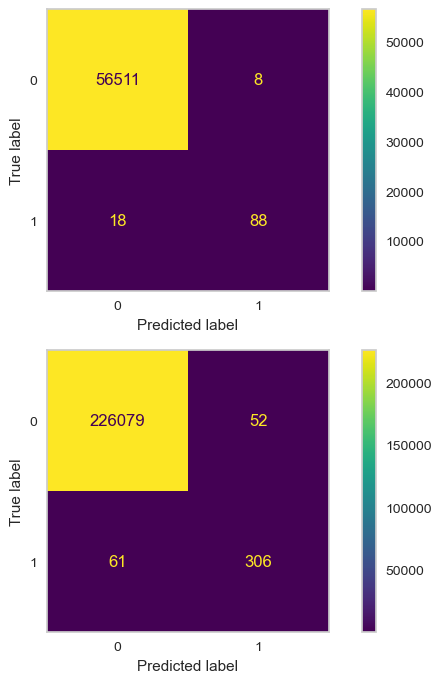

In [154]:
out_score_rf_best_feat = eval_metric_classification(
    model_best_feat, X_train, y_train, X_test, y_test, 
    'Random Forest with Best Feat', average=None, labels=[1]
)
out_score_rf_best_feat

In [155]:
compare_best = pd.concat([
    out_score_rfcwc,
    out_score_rf_best_feat
])
compare_best

,accuracy_test,f1_test,recall_test,precision_test,accuracy_train,f1_train,recall_train,precision_train
Random Forest with CW,1.00,0.89,0.84,0.94,1.00,0.84,0.82,0.86
Random Forest with Best Feat,1.00,0.87,0.83,0.92,1.00,0.84,0.83,0.85


#### Accuracy Comparison

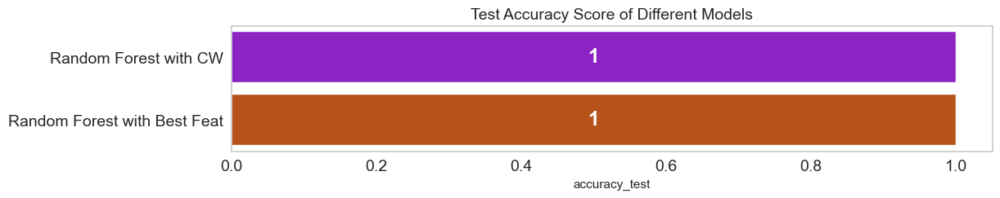

In [156]:
compare = compare_best.sort_values(by='accuracy_test', ascending=False)

plt.figure(figsize=(12,2))
ax = sns.barplot(x='accuracy_test', y=compare.index, data=compare.round(3), palette="gnuplot")
ax.bar_label(ax.containers[0], fontsize=18, color='w', weight='bold', label_type='center', rotation=0)

plt.title("Test Accuracy Score of Different Models", size=14)
plt.yticks(size = 14)
plt.xticks(size = 14)
plt.show()

#### Recall Score Comparison

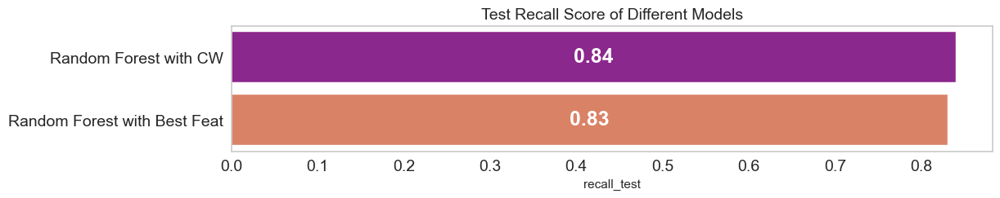

In [157]:
compare = compare_best.sort_values(by='recall_test', ascending=False)

plt.figure(figsize=(12,2))
ax = sns.barplot(x='recall_test', y=compare.index, data=compare.round(3), palette="plasma")
ax.bar_label(ax.containers[0], fontsize=18, color='w', weight='bold', label_type='center', rotation=0)

plt.title("Test Recall Score of Different Models", size=14)
plt.yticks(size = 14)
plt.xticks(size = 14)
plt.show()

#### F1 Score Comparison

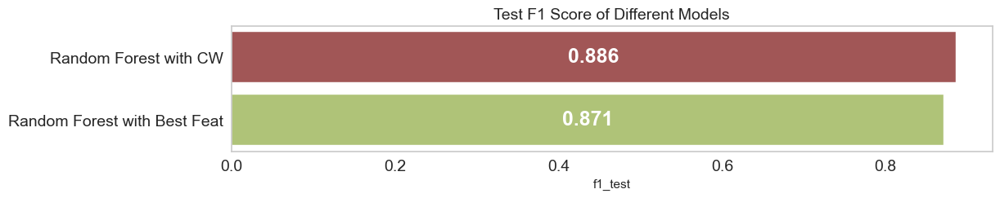

In [158]:
compare = compare_best.sort_values(by='f1_test', ascending=False)

plt.figure(figsize=(12,2))
ax = sns.barplot(x='f1_test', y=compare.index, data=compare.round(3), palette="tab20b_r")
ax.bar_label(ax.containers[0], fontsize=18, color='w', weight='bold', label_type='center', rotation=0)

plt.title("Test F1 Score of Different Models", size=14)
plt.yticks(size = 14)
plt.xticks(size = 14)
plt.show()

#### Precision Score Comparison

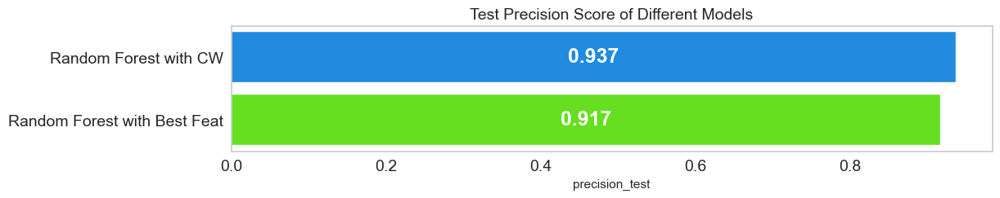

In [159]:
compare = compare_best.sort_values(by='precision_test', ascending=False)

plt.figure(figsize=(12,2))
ax = sns.barplot(x='precision_test', y=compare.index, data=compare.round(3), palette="gist_rainbow_r")
ax.bar_label(ax.containers[0], fontsize=18, color='w', weight='bold', label_type='center', rotation=0)

plt.title("Test Precision Score of Different Models", size=14)
plt.yticks(size = 14)
plt.xticks(size = 14)
plt.show()

## Model Deployement
You cooked the food in the kitchen and moved on to the serving stage. The question is how do you showcase your work to others? Model Deployement helps you showcase your work to the world and make better decisions with it. But, deploying a model can get a little tricky at times. Before deploying the model, many things such as data storage, preprocessing, model building and monitoring need to be studied.

Deployment of machine learning models, means making your models available to your other business systems. By deploying models, other systems can send data to them and get their predictions, which are in turn populated back into the company systems. Through machine learning model deployment, can begin to take full advantage of the model you built.

Data science is concerned with how to build machine learning models, which algorithm is more predictive, how to design features, and what variables to use to make the models more accurate. However, how these models are actually used is often neglected. And yet this is the most important step in the machine learning pipline. Only when a model is fully integrated with the business systems, real values ​​can be extract from its predictions.

After doing the following operations in this notebook, jump to a proper IDE and create your web app with Streamlit API.

### Built Final Model with Best Features

In [160]:
final_model = RandomForestClassifier(criterion="entropy", max_depth=5, max_features="auto", n_estimators=50,
                               random_state=random_state, class_weight=class_weights_custom)

final_model.fit(X, y)

RandomForestClassifier(class_weight={0: 1, 1: 8}, criterion='entropy',
                       max_depth=5, max_features='auto', n_estimators=50,
                       random_state=101)

In [161]:
X.describe()

,V14,V10,V12,V17,V11,V4,V16,V3,V7,V9
count,283123.00,283123.00,283123.00,283123.00,283123.00,283123.00,283123.00,283123.00,283123.00,283123.00
mean,-0.00,0.00,-0.00,0.00,-0.00,-0.01,-0.00,0.01,-0.01,-0.00
std,0.95,1.07,0.99,0.84,1.02,1.41,0.87,1.49,1.12,1.09
min,-19.21,-24.59,-18.68,-25.16,-4.80,-5.68,-14.13,-33.68,-43.56,-13.43
25%,-0.43,-0.53,-0.41,-0.48,-0.76,-0.85,-0.47,-0.88,-0.55,-0.64
50%,0.05,-0.09,0.14,-0.07,-0.03,-0.02,0.07,0.18,0.04,-0.05
75%,0.49,0.46,0.62,0.40,0.74,0.73,0.52,1.03,0.57,0.60
max,10.53,23.75,7.85,9.25,12.02,16.49,6.44,9.38,21.01,15.59


In [162]:
my_dict = {
    "V14": 0.05,
    "V10": 0.46,
    "V12": -0.14,
    "V17": -0.5,
    "V11": -0.70,
    "V4": 0.73,
    "V16": 0.5,
    "V3": -0.32,
    "V7": 0.3,
    "V9": 0.10    
}

new_obs = pd.DataFrame([my_dict])
new_obs

,V14,V10,V12,V17,V11,V4,V16,V3,V7,V9
0,0.05,0.46,-0.14,-0.50,-0.70,0.73,0.50,-0.32,0.30,0.10


In [163]:
final_model.predict(new_obs)

array([0], dtype=int64)

### Save and Export the Best Model


In [164]:
# Saving final model

import pickle
pickle.dump(final_model, open("final_model_fraud_detection", 'wb'))

### Save and Export Variables

In [165]:
model = pickle.load(open("final_model_fraud_detection", "rb"))

In [166]:
model.predict(new_obs)

array([0], dtype=int64)

___

<p style="text-align: center;"><img src="https://docs.google.com/uc?id=1lY0Uj5R04yMY3-ZppPWxqCr5pvBLYPnV" class="img-fluid" alt="CLRSWY"></p>

___